In [1]:
using Revise

In [2]:
using MeshCatMechanisms
using MeshCat
using RigidBodyDynamics
using Flux
using ProgressMeter
using MLDataPattern
using JLD2
using Plots; gr()
using LCPSim
using LearningMPC
using LearningMPC.Models

HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/9db0e137604e898c25f194d972715156bd46cb81-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/9db0e137604e898c25f194d972715156bd46cb81-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

INFO: Loading HttpServer methods...


In [3]:
using Blink

In [4]:
robot = BoxAtlas(add_contacts=false)
mvis = MechanismVisualizer(robot)
open(mvis, Window())

Blink.AtomShell.Window(1, Blink.AtomShell.Electron(Process(`/home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/Blink/deps/atom/electron /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/Blink/src/AtomShell/main.js port 4230`, ProcessRunning), TCPSocket(RawFD(56) active, 0 bytes waiting), Dict{String,Any}(Pair{String,Any}("callback", Blink.#1))), Blink.Page(1, WebSockets.WebSocket{TCPSocket}(TCPSocket(RawFD(62) active, 0 bytes waiting), true, CONNECTED::WebSockets.ReadyState = 1), Dict{String,Any}(Pair{String,Any}("webio", WebIO.#111),Pair{String,Any}("callback", Blink.#1)), Future(1, 1, 1, Nullable{Any}(true))))

In [5]:
params = MPCParams(robot)
lqrsol = LQRSolution(robot, params, false)
net, loss = LearningMPC.mimic_net([22, 32, 32, 11]; regularization=1e-3)
optimizer = Flux.ADAM(Flux.params(net))

net_controller = let net = net
    function (τ, t, x)
        τ .= Flux.Tracker.data(net(LearningMPC.qv(x)))
    end
end

full_mpc_controller = MPCController(robot, params, lqrsol, [lqrsol, net_controller]);

Academic license - for non-commercial use only
Academic license - for non-commercial use only


In [6]:
sample_sink = LearningMPC.MPCSampleSink(keep_nulls=false; lqrsol=lqrsol, 
    lqr_warmstart_index=1,
    learned_warmstart_index=2)

playback_sink = LearningMPC.PlaybackSink{Float64}(mvis)

full_mpc_controller.callback = LearningMPC.multiplex!(
    sample_sink,
    playback_sink
)

live_viewer = LearningMPC.live_viewer(mvis)

dagger_controller = LearningMPC.multiplex!(
    LearningMPC.dagger_controller(
        full_mpc_controller,
        net_controller),
    live_viewer
    )

collect_into! = let x_init = nominal_state(robot), x0 = MechanismState{Float64}(robot.mechanism), sink = sample_sink
    function (data::Vector{<:LearningMPC.Sample}, σv)
        empty!(sink)
#         copy!(x0, x_init)
#         set_velocity!(x0, findjoint(x0.mechanism, "floating_base"),
#             [σv * (2 * (rand() - 0.5)), 0.0, 0.0])
        LearningMPC.randomize!(x0, x_init, 0.0, σv)
        Δv = zeros(num_velocities(x0))
        Δv[1] = σv * (2 * rand() - 0.5)
        set_velocity!(x0, velocity(x0) .+ Δv)
        results = LCPSim.simulate(x0, 
            dagger_controller,
            robot.environment, params.Δt, 25, 
            params.lcp_solver;
            termination=x -> configuration(x)[3] > π/4 || configuration(x)[3] < -π/4);
        append!(data, sink.samples)
    end
end

(::#3) (generic function with 1 method)

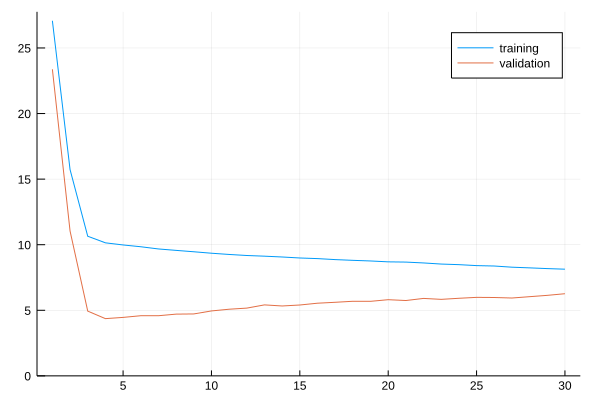

  5.009766 seconds (6.44 M allocations: 707.567 MiB, 6.22% gc time)


Progress:   0%|                                         |  ETA: 14:56:18

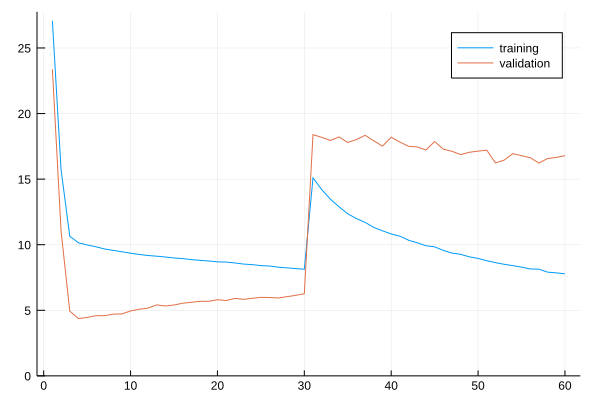

  3.074474 seconds (8.77 M allocations: 1.155 GiB, 14.69% gc time)


Progress:   1%|                                         |  ETA: 15:45:55

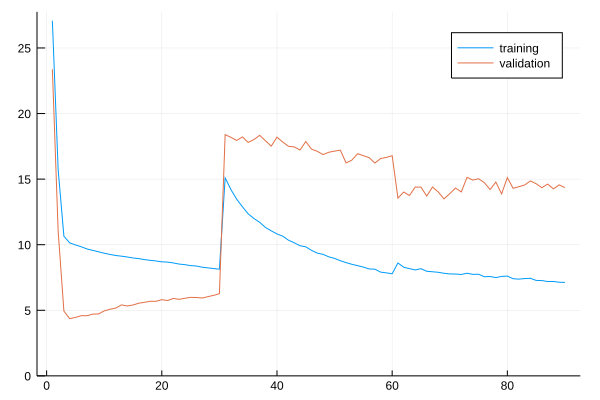

  4.612978 seconds (13.19 M allocations: 1.734 GiB, 13.65% gc time)


Progress:   2%|█                                        |  ETA: 15:30:24

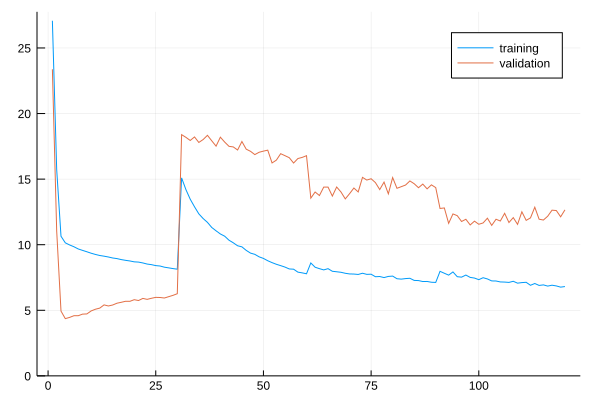

  5.955775 seconds (17.73 M allocations: 2.331 GiB, 13.29% gc time)


Progress:   2%|█                                        |  ETA: 15:38:20

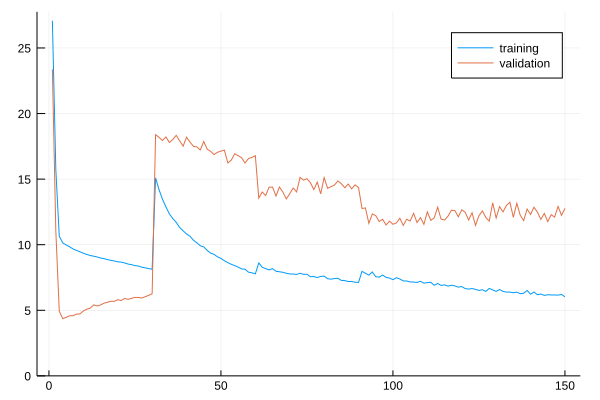

  7.541845 seconds (22.27 M allocations: 2.929 GiB, 13.49% gc time)


Progress:   2%|█                                        |  ETA: 15:41:20

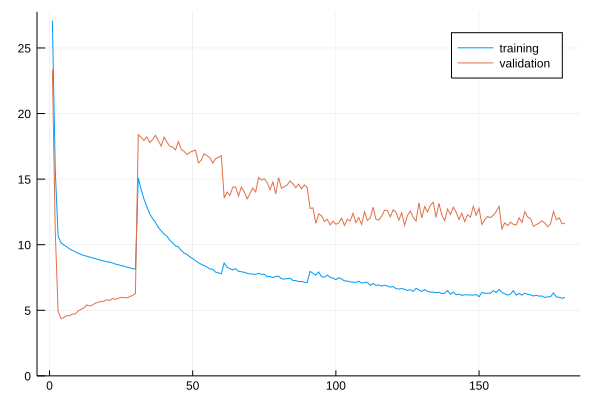

  9.231379 seconds (26.81 M allocations: 3.526 GiB, 13.37% gc time)


Progress:   3%|█                                        |  ETA: 15:44:19

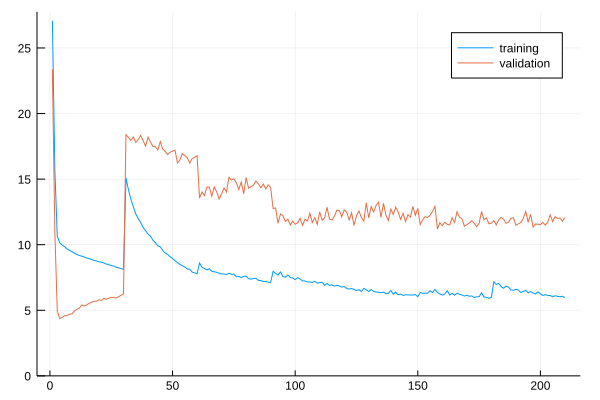

 10.993651 seconds (31.36 M allocations: 4.124 GiB, 13.21% gc time)


Progress:   4%|█                                        |  ETA: 15:47:50

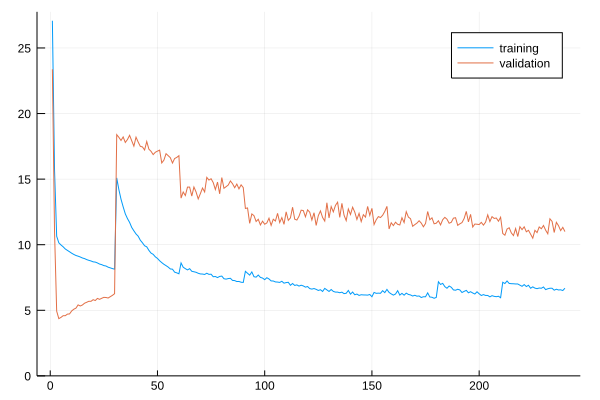

 12.378237 seconds (35.90 M allocations: 4.721 GiB, 13.40% gc time)


Progress:   4%|██                                       |  ETA: 15:50:38

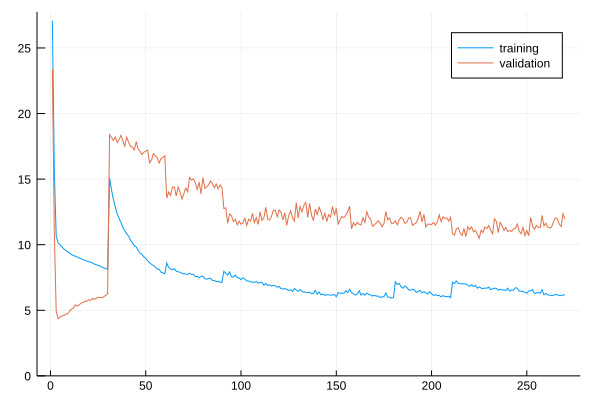

 14.014797 seconds (40.44 M allocations: 5.319 GiB, 13.42% gc time)


Progress:   4%|██                                       |  ETA: 15:45:25

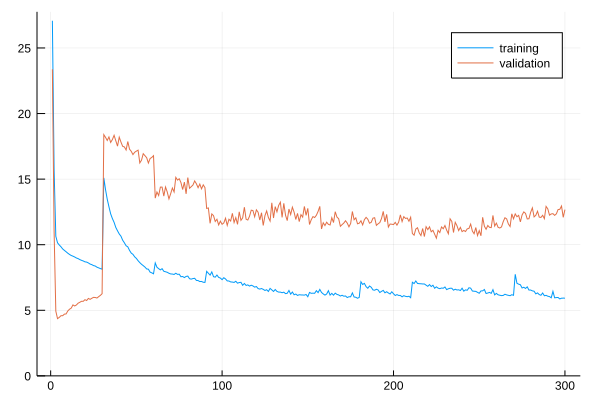

 15.455108 seconds (44.98 M allocations: 5.916 GiB, 13.54% gc time)


Progress:   5%|██                                       |  ETA: 15:47:17

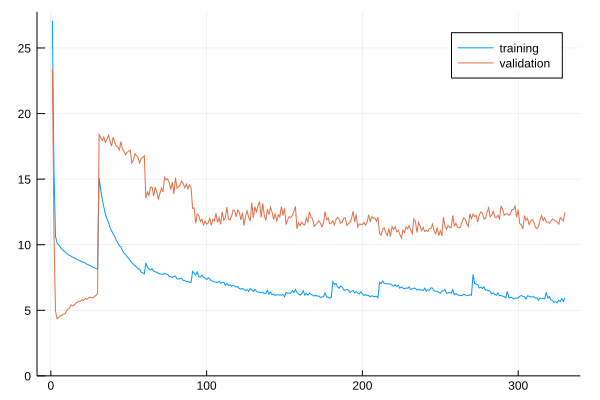

 16.639448 seconds (49.52 M allocations: 6.514 GiB, 13.26% gc time)


Progress:   6%|██                                       |  ETA: 15:45:52

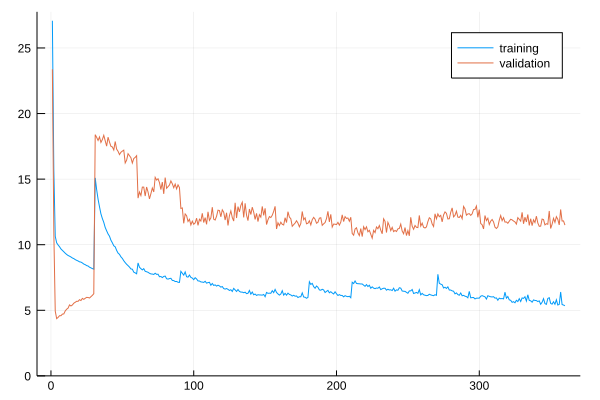

 18.925498 seconds (53.99 M allocations: 7.101 GiB, 14.78% gc time)


Progress:   6%|██                                       |  ETA: 15:43:27

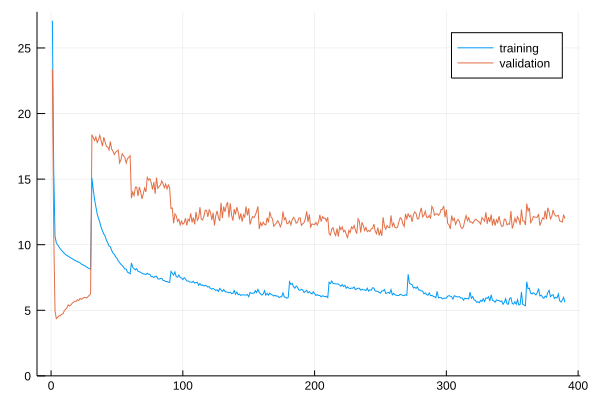

 20.636093 seconds (58.45 M allocations: 7.687 GiB, 13.99% gc time)


Progress:   6%|███                                      |  ETA: 15:40:27

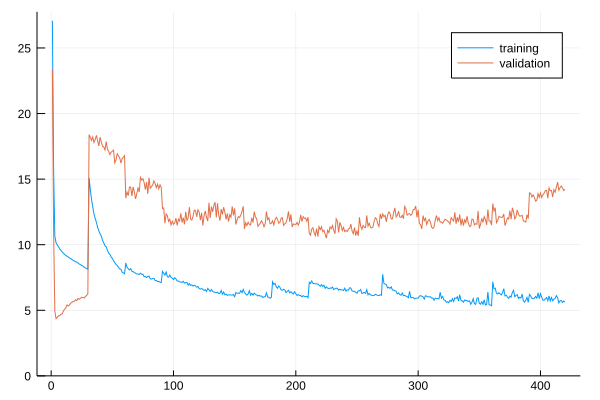

 21.744810 seconds (62.66 M allocations: 8.239 GiB, 14.37% gc time)


Progress:   7%|███                                      |  ETA: 15:30:52

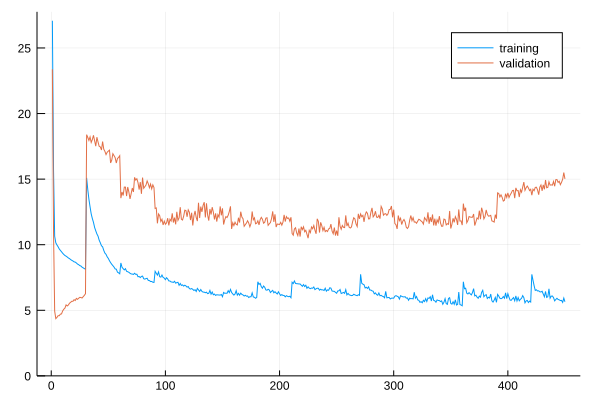

 23.787444 seconds (67.21 M allocations: 8.836 GiB, 13.28% gc time)


Progress:   8%|███                                      |  ETA: 15:31:06

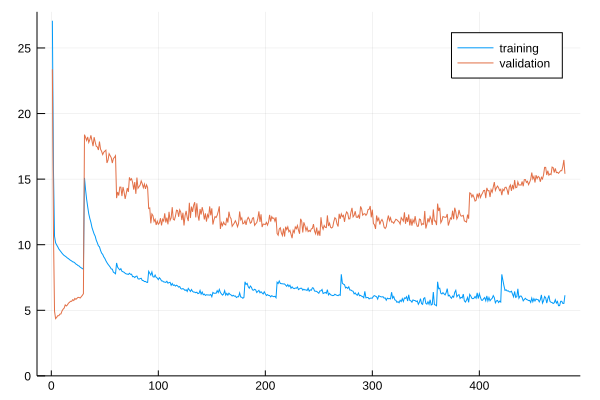

 24.866405 seconds (71.75 M allocations: 9.434 GiB, 12.82% gc time)


Progress:   8%|███                                      |  ETA: 15:32:41

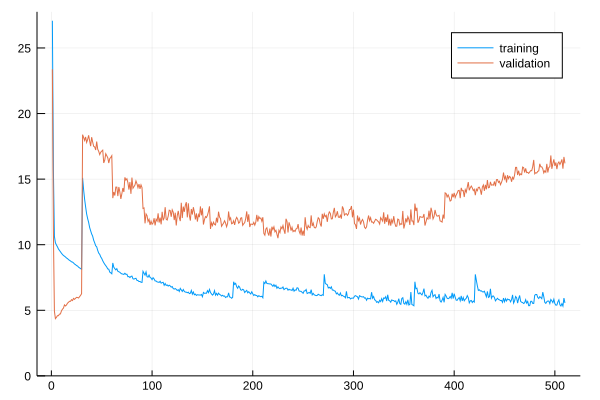

 26.310786 seconds (76.29 M allocations: 10.031 GiB, 14.23% gc time)


Progress:   8%|███                                      |  ETA: 15:33:37

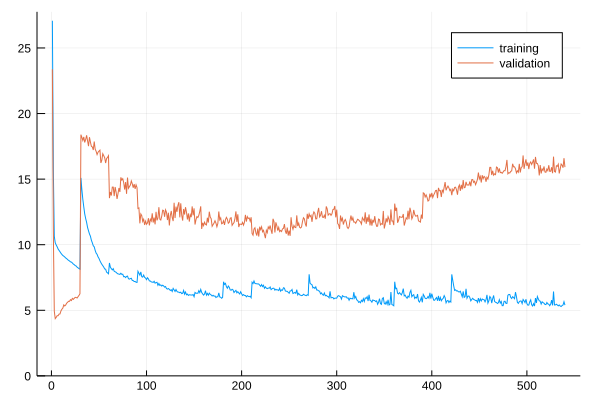

 27.561925 seconds (80.83 M allocations: 10.629 GiB, 13.18% gc time)


Progress:   9%|████                                     |  ETA: 15:31:49

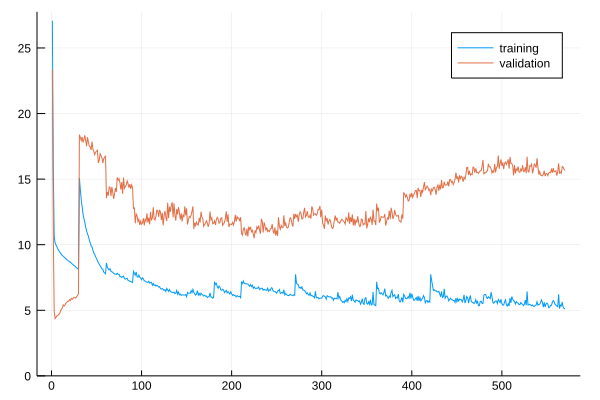

 29.477153 seconds (85.37 M allocations: 11.226 GiB, 13.35% gc time)


Progress:  10%|████                                     |  ETA: 15:30:43

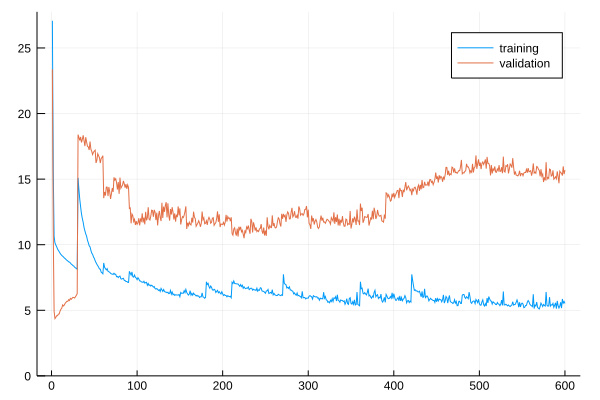

 30.862558 seconds (89.92 M allocations: 11.824 GiB, 13.35% gc time)


Progress:  10%|████                                     |  ETA: 15:27:43

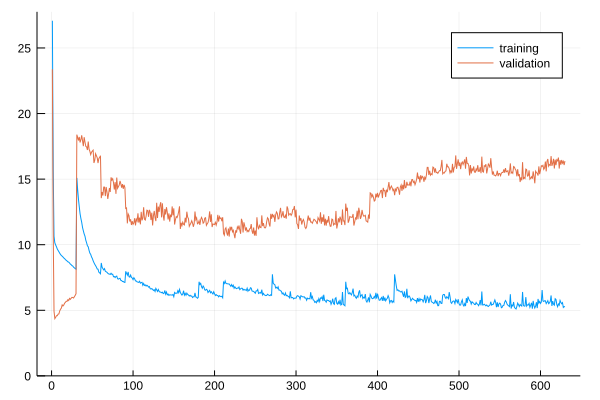

 33.156744 seconds (94.46 M allocations: 12.421 GiB, 13.54% gc time)


Progress:  10%|████                                     |  ETA: 15:25:53

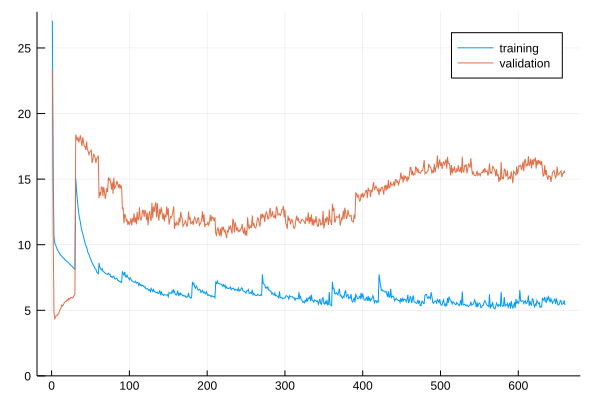

 35.163114 seconds (98.53 M allocations: 12.958 GiB, 15.12% gc time)


Progress:  11%|█████                                    |  ETA: 15:19:41

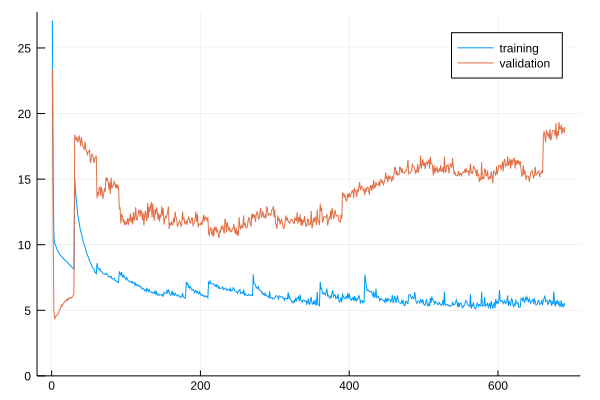

 35.387005 seconds (101.83 M allocations: 13.391 GiB, 14.50% gc time)


Progress:  12%|█████                                    |  ETA: 15:06:43

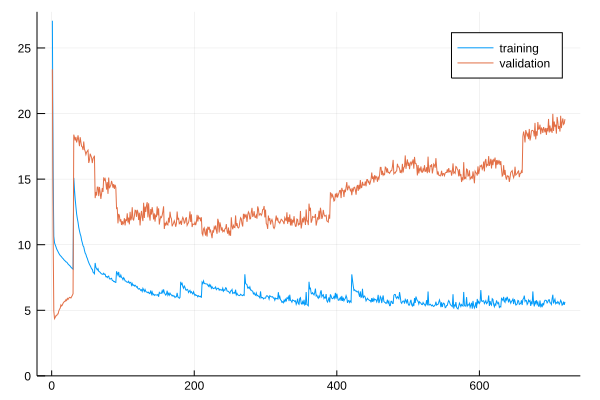

 36.605387 seconds (106.37 M allocations: 13.989 GiB, 13.55% gc time)


Progress:  12%|█████                                    |  ETA: 15:07:04

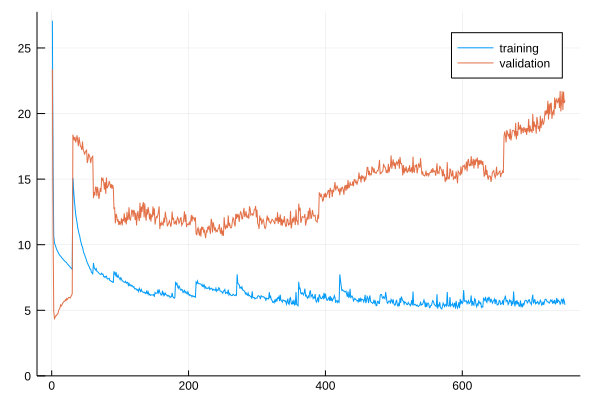

 39.401830 seconds (110.91 M allocations: 14.586 GiB, 13.40% gc time)


Progress:  12%|█████                                    |  ETA: 15:04:57

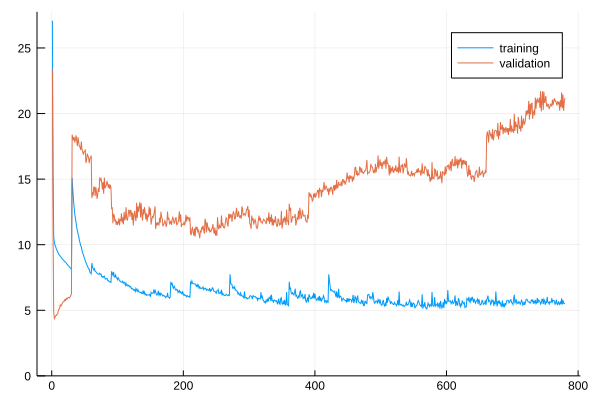

 39.033514 seconds (115.46 M allocations: 15.184 GiB, 13.42% gc time)


Progress:  13%|█████                                    |  ETA: 15:02:54

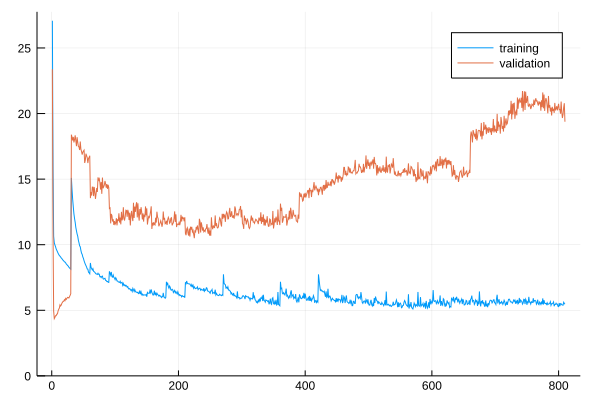

 40.596548 seconds (120.00 M allocations: 15.781 GiB, 13.55% gc time)


Progress:  14%|██████                                   |  ETA: 15:02:14

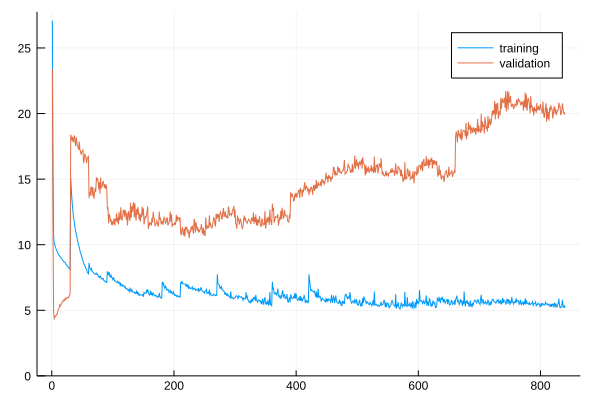

 42.095500 seconds (124.54 M allocations: 16.379 GiB, 13.33% gc time)


Progress:  14%|██████                                   |  ETA: 15:00:24

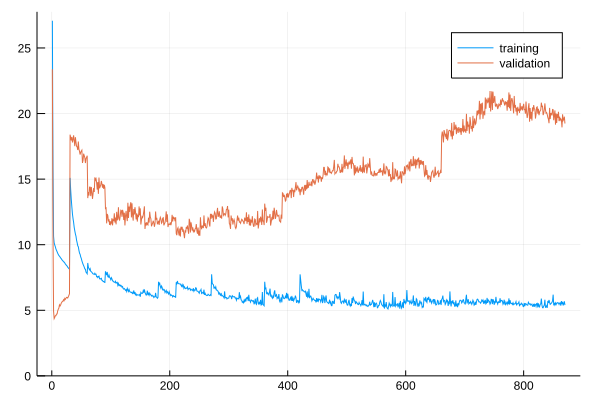

 44.140173 seconds (129.03 M allocations: 16.969 GiB, 14.54% gc time)


Progress:  14%|██████                                   |  ETA: 14:57:04

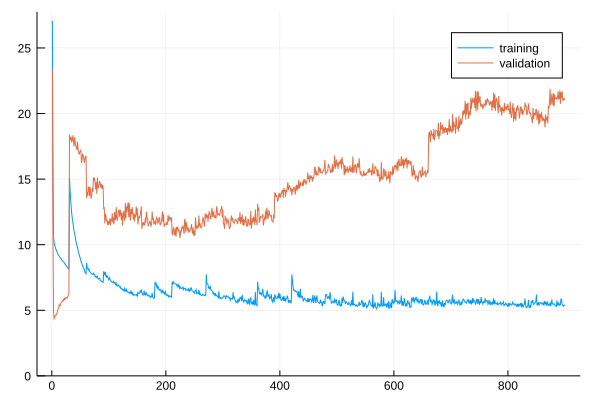

 46.457566 seconds (133.52 M allocations: 17.559 GiB, 13.43% gc time)


Progress:  15%|██████                                   |  ETA: 14:55:08

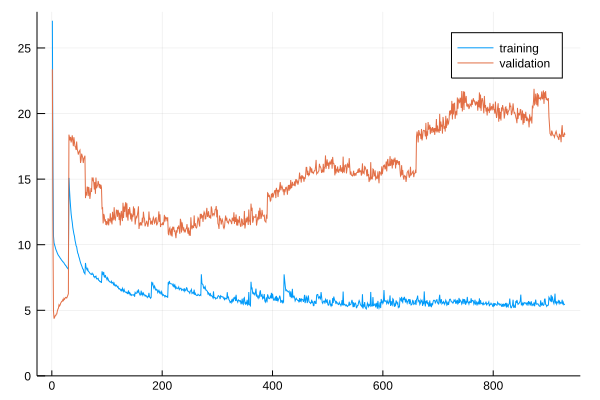

 47.085650 seconds (138.07 M allocations: 18.156 GiB, 13.71% gc time)


Progress:  16%|██████                                   |  ETA: 14:53:09

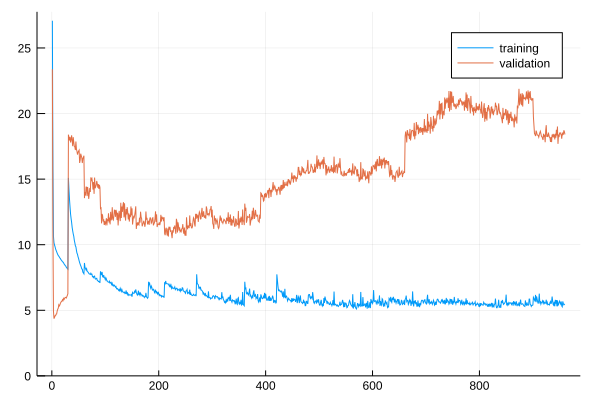

 48.759091 seconds (142.61 M allocations: 18.754 GiB, 13.39% gc time)


Progress:  16%|███████                                  |  ETA: 14:49:56

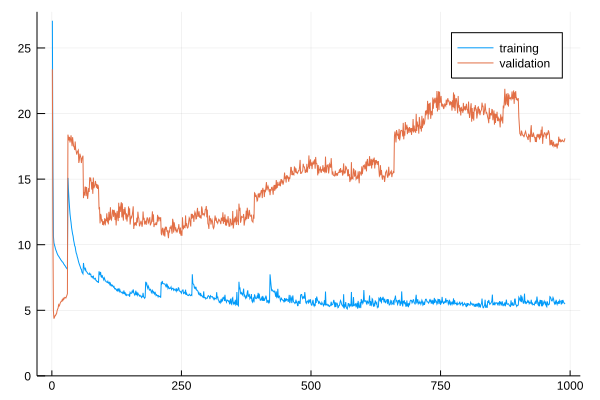

 50.457522 seconds (147.15 M allocations: 19.351 GiB, 13.57% gc time)


Progress:  16%|███████                                  |  ETA: 14:47:27

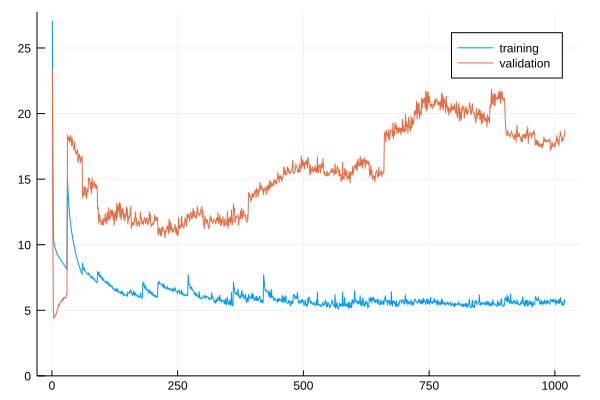

 51.865294 seconds (151.69 M allocations: 19.949 GiB, 13.49% gc time)


Progress:  17%|███████                                  |  ETA: 14:44:33

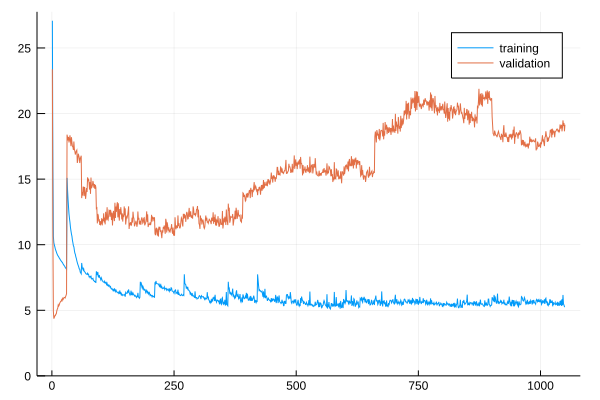

 54.666873 seconds (156.03 M allocations: 20.517 GiB, 14.52% gc time)


Progress:  18%|███████                                  |  ETA: 14:39:14

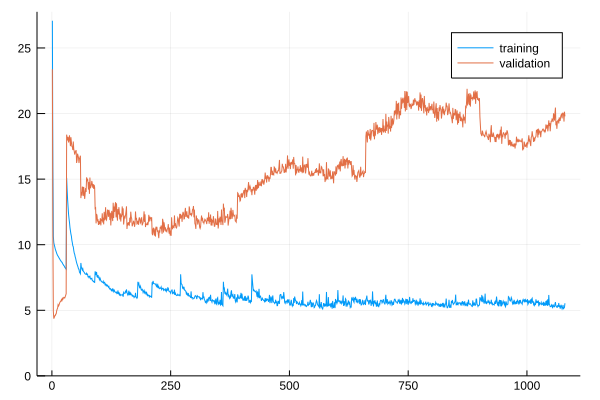

 54.804625 seconds (160.22 M allocations: 21.063 GiB, 13.56% gc time)


Progress:  18%|███████                                  |  ETA: 14:31:16

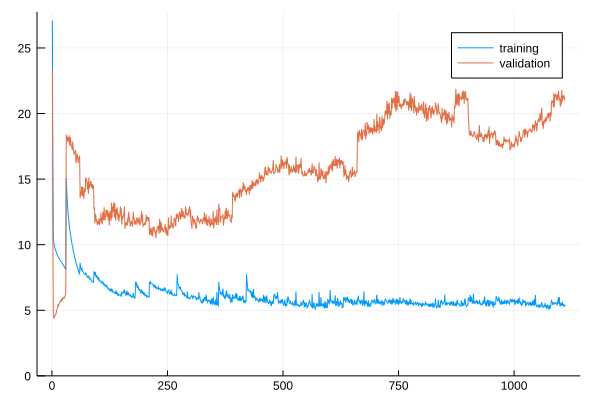

 55.929869 seconds (164.54 M allocations: 21.628 GiB, 13.38% gc time)


Progress:  18%|████████                                 |  ETA: 14:27:28

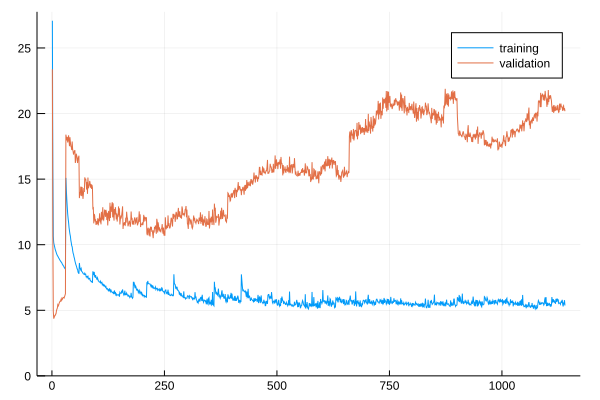

 58.384625 seconds (168.61 M allocations: 22.164 GiB, 13.90% gc time)


Progress:  19%|████████                                 |  ETA: 14:22:44

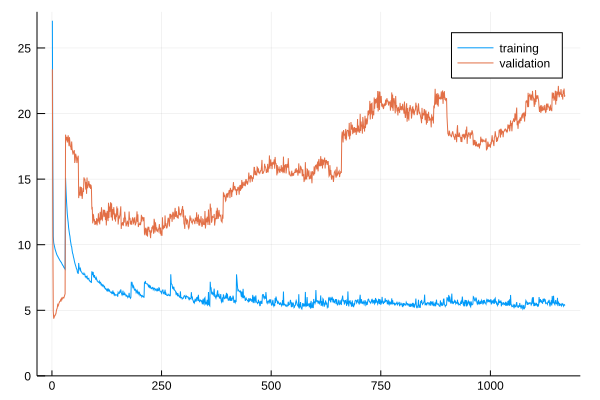

 58.981098 seconds (173.08 M allocations: 22.751 GiB, 13.33% gc time)


Progress:  20%|████████                                 |  ETA: 14:19:26

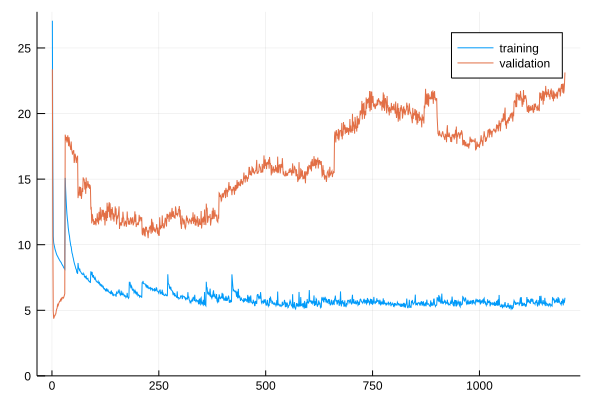

 60.740632 seconds (177.47 M allocations: 23.328 GiB, 13.75% gc time)


Progress:  20%|████████                                 |  ETA: 14:16:27

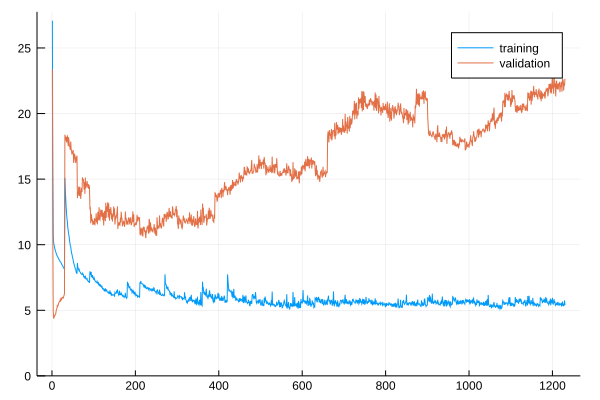

 62.123431 seconds (181.96 M allocations: 23.918 GiB, 13.70% gc time)


Progress:  20%|████████                                 |  ETA: 14:13:07

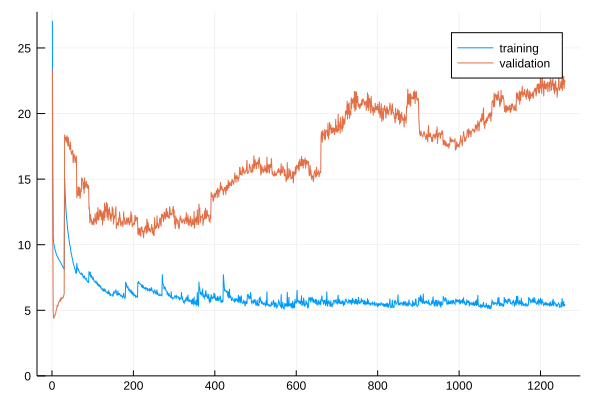

 63.860227 seconds (186.50 M allocations: 24.516 GiB, 13.69% gc time)


Progress:  21%|█████████                                |  ETA: 14:10:09

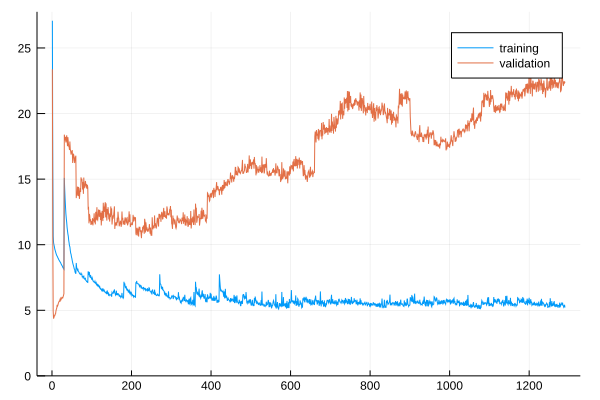

 65.039785 seconds (190.89 M allocations: 25.093 GiB, 13.40% gc time)


Progress:  22%|█████████                                |  ETA: 14:07:03

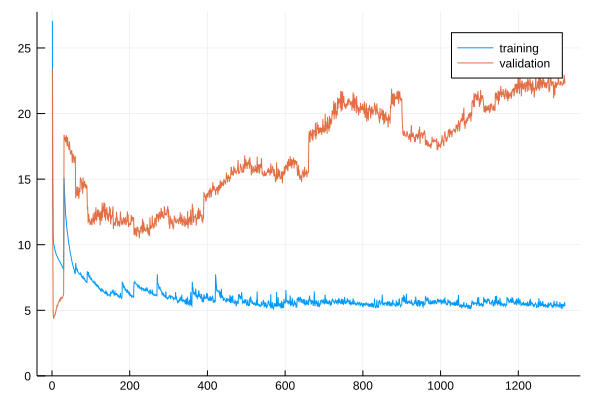

 67.109866 seconds (195.43 M allocations: 25.690 GiB, 13.41% gc time)


Progress:  22%|█████████                                |  ETA: 14:04:20

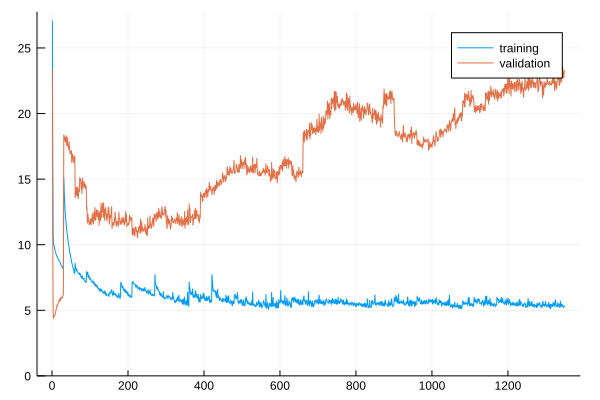

 69.006486 seconds (199.97 M allocations: 26.288 GiB, 13.76% gc time)


Progress:  22%|█████████                                |  ETA: 14:01:59

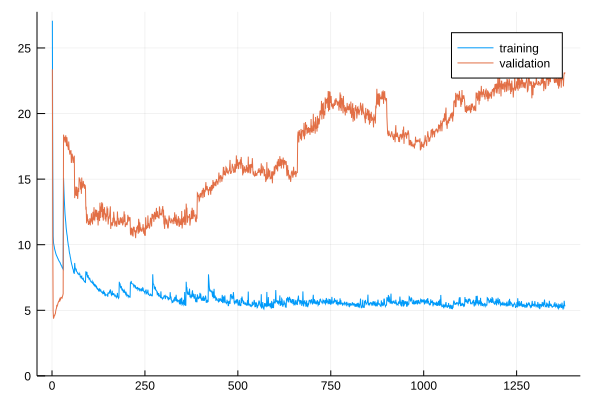

 70.063013 seconds (204.51 M allocations: 26.885 GiB, 13.68% gc time)


Progress:  23%|█████████                                |  ETA: 13:58:34

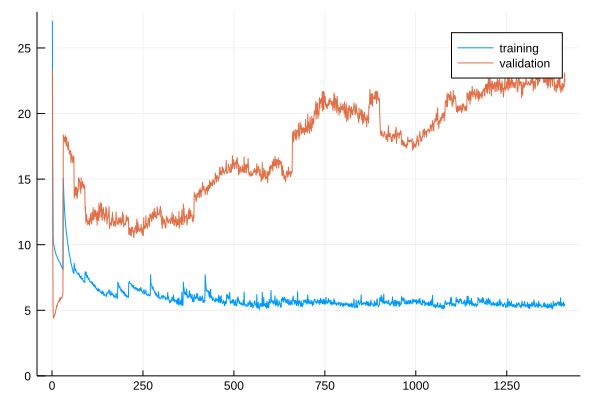

 72.160176 seconds (209.05 M allocations: 27.483 GiB, 13.66% gc time)


Progress:  24%|██████████                               |  ETA: 13:55:19

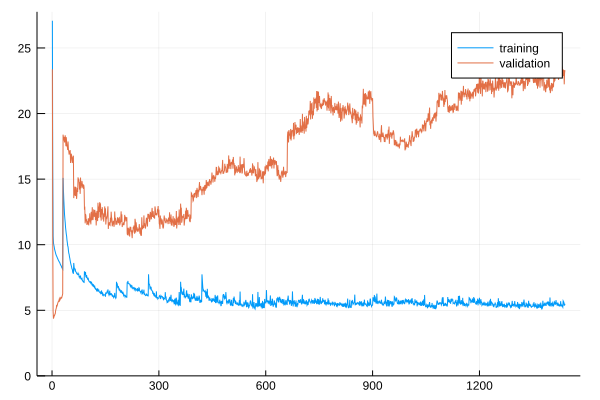

 72.481259 seconds (212.95 M allocations: 27.993 GiB, 13.59% gc time)


Progress:  24%|██████████                               |  ETA: 13:48:55

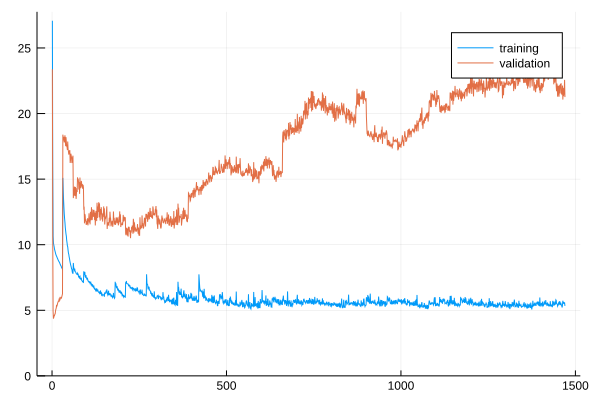

 75.352537 seconds (217.03 M allocations: 28.530 GiB, 14.56% gc time)


Progress:  24%|██████████                               |  ETA: 13:45:12

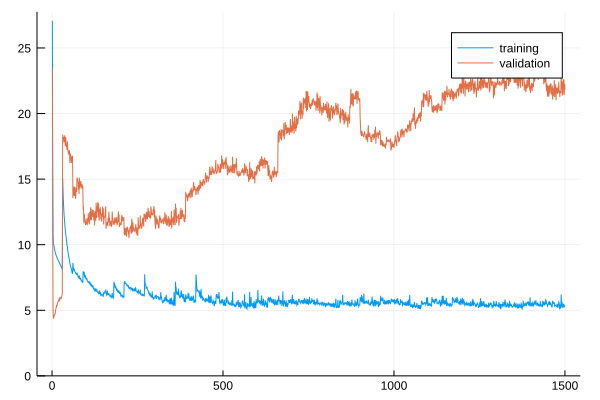

 75.808670 seconds (221.44 M allocations: 29.109 GiB, 13.91% gc time)


Progress:  25%|██████████                               |  ETA: 13:41:01

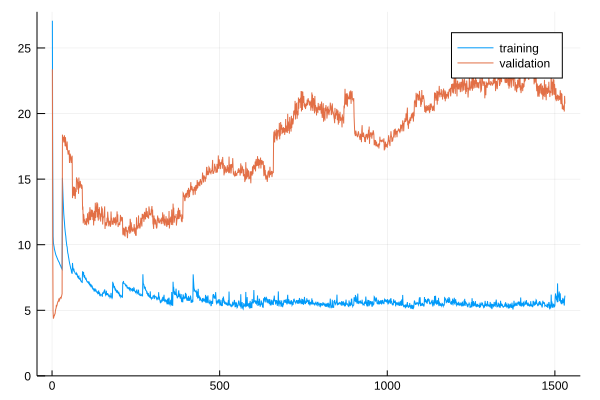

 76.624203 seconds (225.24 M allocations: 29.606 GiB, 13.29% gc time)


Progress:  26%|██████████                               |  ETA: 13:34:56

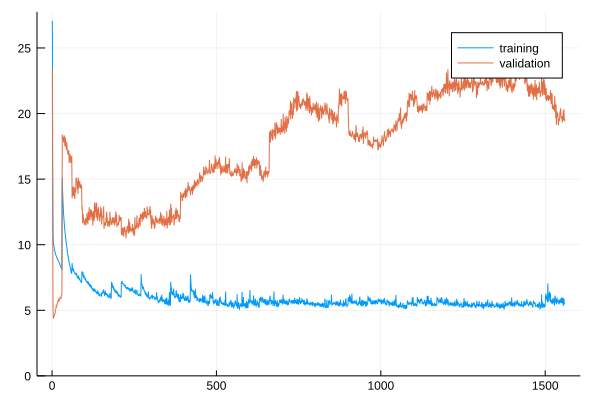

 78.997367 seconds (228.76 M allocations: 30.072 GiB, 13.91% gc time)


Progress:  26%|███████████                              |  ETA: 13:29:40

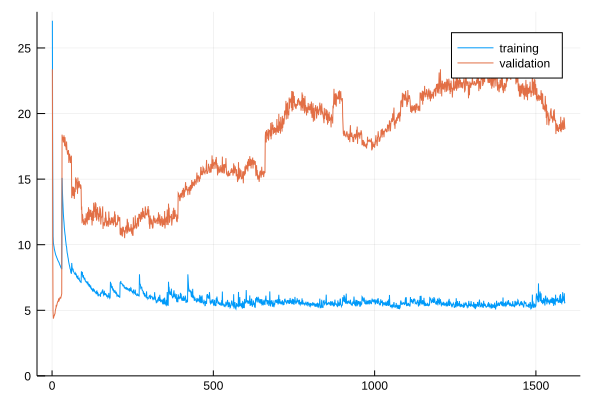

 79.807642 seconds (233.30 M allocations: 30.670 GiB, 13.71% gc time)


Progress:  26%|███████████                              |  ETA: 13:26:06

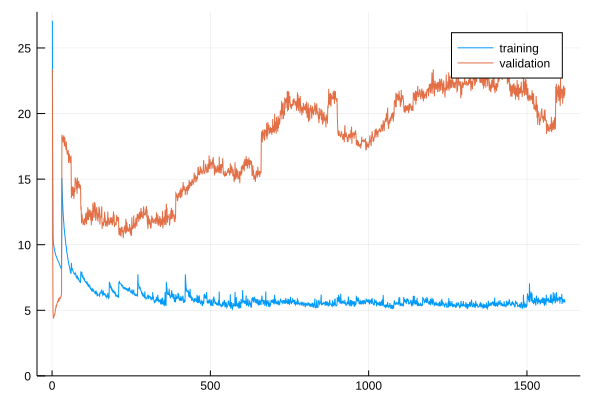

 80.435159 seconds (236.51 M allocations: 31.095 GiB, 13.39% gc time)


Progress:  27%|███████████                              |  ETA: 13:19:52

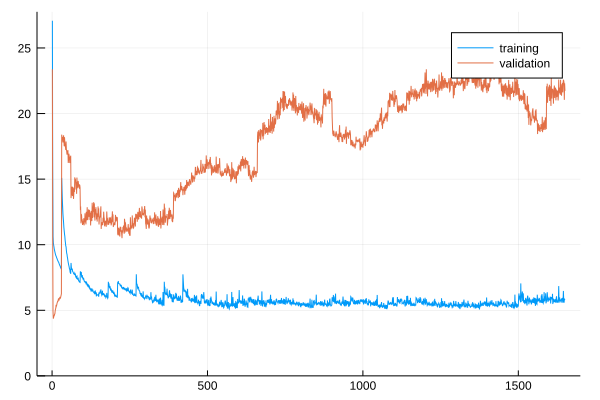

 82.883043 seconds (241.05 M allocations: 31.693 GiB, 13.75% gc time)


Progress:  28%|███████████                              |  ETA: 13:16:42

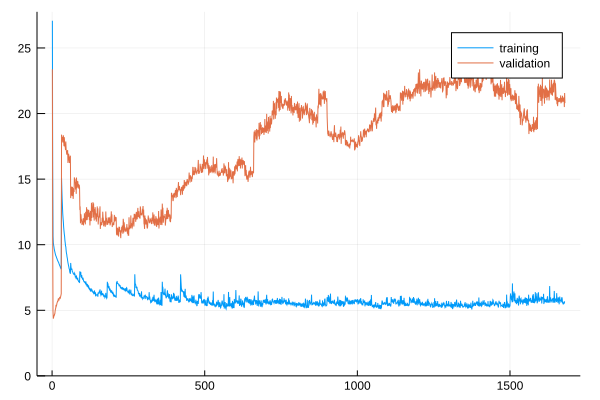

 85.119651 seconds (244.73 M allocations: 32.179 GiB, 14.36% gc time)


Progress:  28%|███████████                              |  ETA: 13:11:50

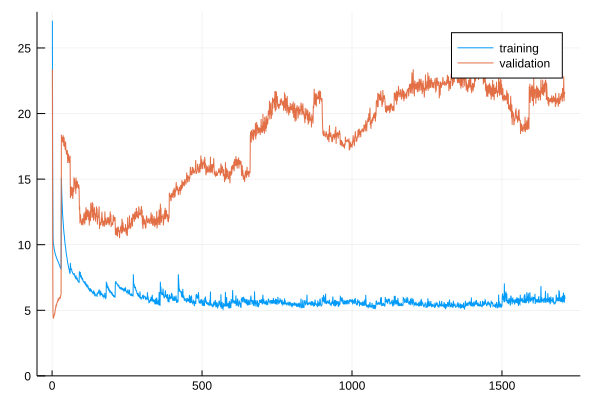

 85.761237 seconds (249.28 M allocations: 32.777 GiB, 13.72% gc time)


Progress:  28%|████████████                             |  ETA: 13:09:20

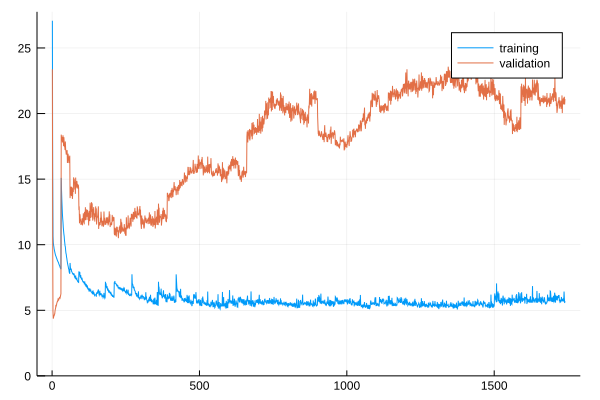

 87.123207 seconds (253.82 M allocations: 33.374 GiB, 13.75% gc time)


Progress:  29%|████████████                             |  ETA: 13:06:12

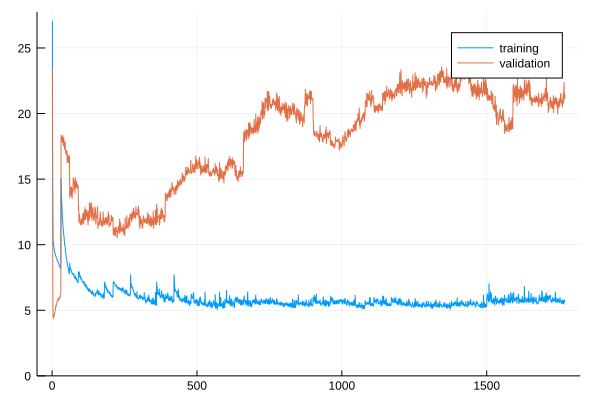

 88.460330 seconds (258.36 M allocations: 33.972 GiB, 13.64% gc time)


Progress:  30%|████████████                             |  ETA: 13:02:12

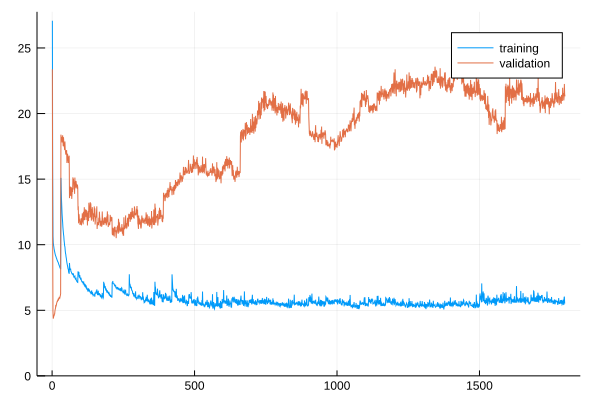

 90.265007 seconds (262.90 M allocations: 34.569 GiB, 13.49% gc time)


Progress:  30%|████████████                             |  ETA: 12:59:18

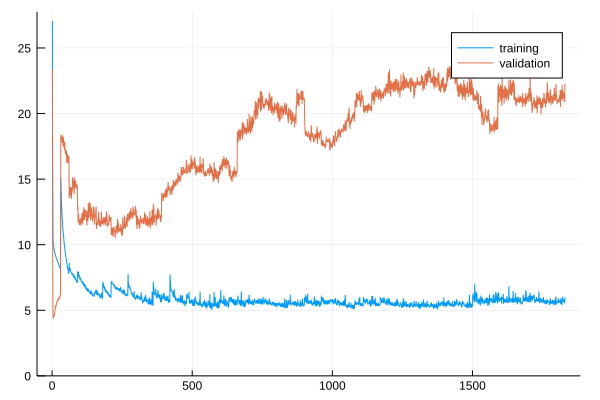

 91.890796 seconds (266.66 M allocations: 35.065 GiB, 13.96% gc time)


Progress:  30%|█████████████                            |  ETA: 12:54:47

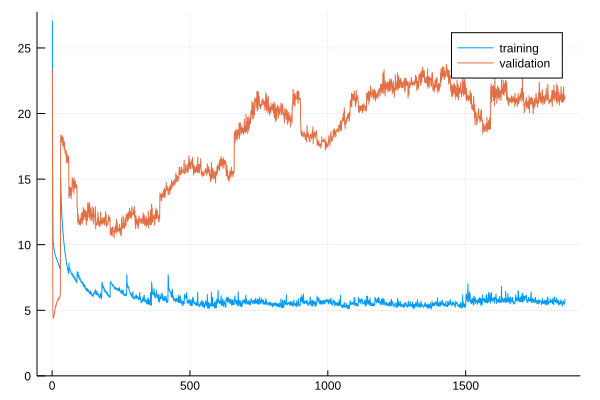

 92.049156 seconds (271.20 M allocations: 35.663 GiB, 13.32% gc time)


Progress:  31%|█████████████                            |  ETA: 12:51:08

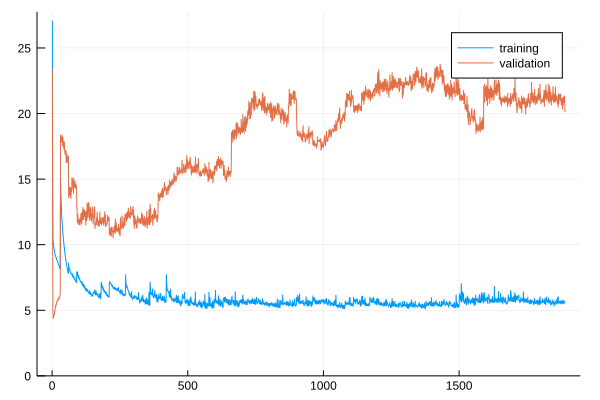

 94.652411 seconds (275.75 M allocations: 36.260 GiB, 13.79% gc time)


Progress:  32%|█████████████                            |  ETA: 12:47:51

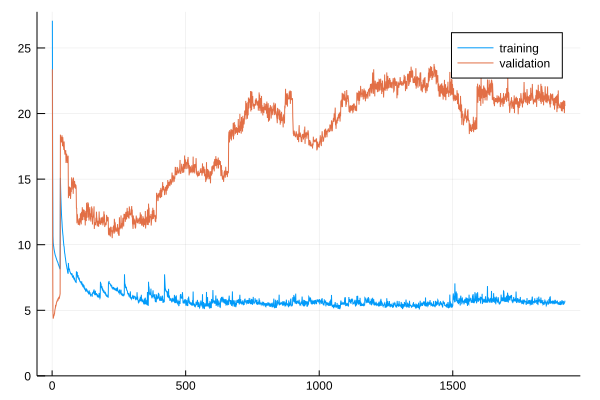

 96.444490 seconds (280.29 M allocations: 36.858 GiB, 13.64% gc time)


Progress:  32%|█████████████                            |  ETA: 12:44:17

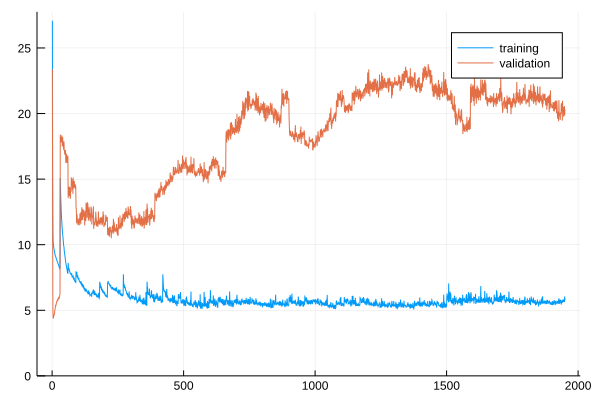

 96.471829 seconds (282.64 M allocations: 37.172 GiB, 13.71% gc time)


Progress:  32%|█████████████                            |  ETA: 12:36:51

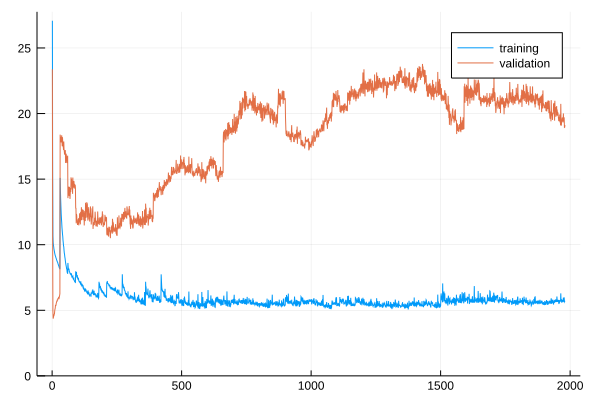

 98.698480 seconds (286.16 M allocations: 37.638 GiB, 13.87% gc time)


Progress:  33%|██████████████                           |  ETA: 12:31:26

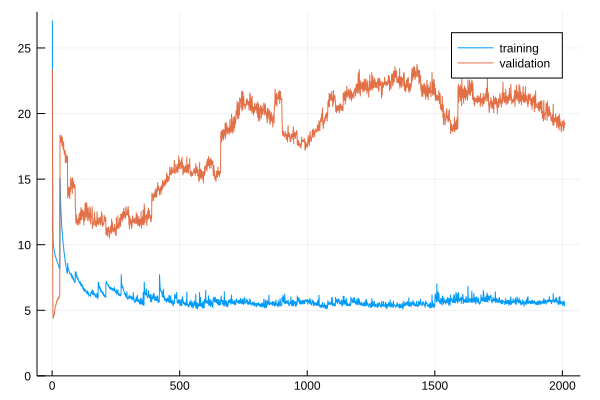

 99.303010 seconds (290.70 M allocations: 38.235 GiB, 13.30% gc time)


Progress:  34%|██████████████                           |  ETA: 12:27:33

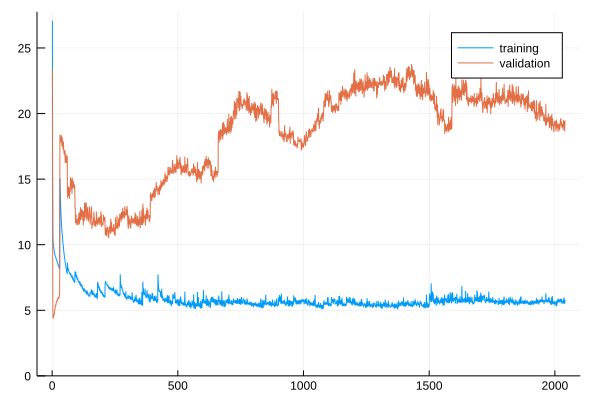

102.454996 seconds (295.14 M allocations: 38.818 GiB, 14.68% gc time)


Progress:  34%|██████████████                           |  ETA: 12:23:31

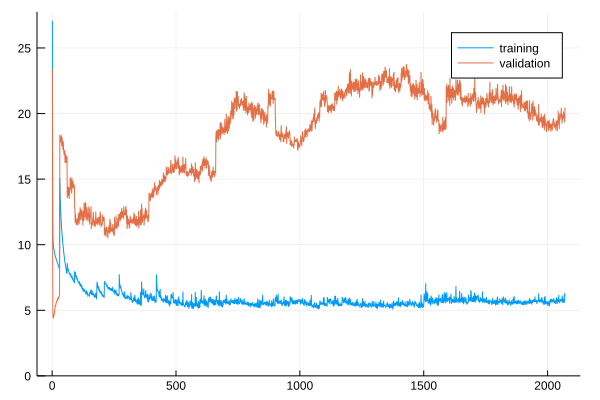

102.568712 seconds (299.54 M allocations: 39.394 GiB, 13.61% gc time)


Progress:  34%|██████████████                           |  ETA: 12:19:17

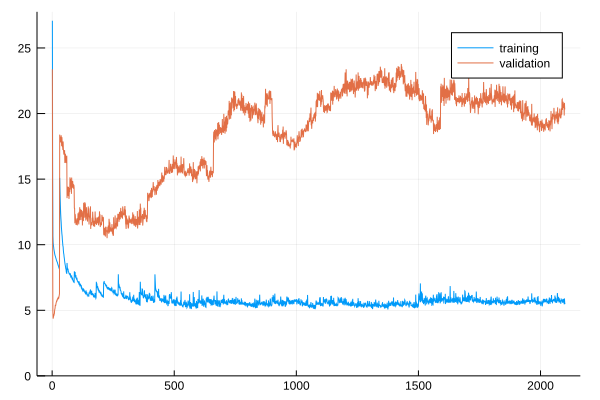

105.540038 seconds (303.69 M allocations: 39.941 GiB, 14.14% gc time)


Progress:  35%|██████████████                           |  ETA: 12:14:59

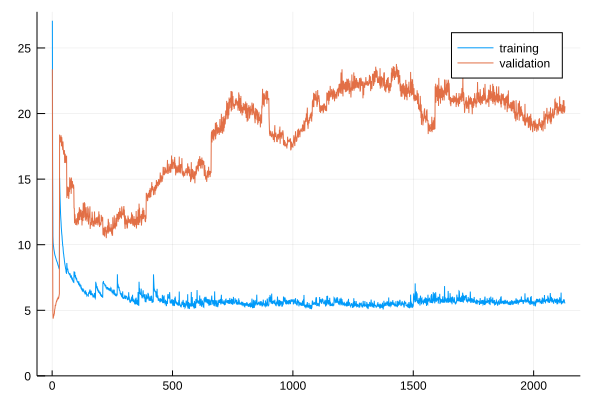

106.177131 seconds (308.23 M allocations: 40.538 GiB, 13.77% gc time)


Progress:  36%|███████████████                          |  ETA: 12:11:06

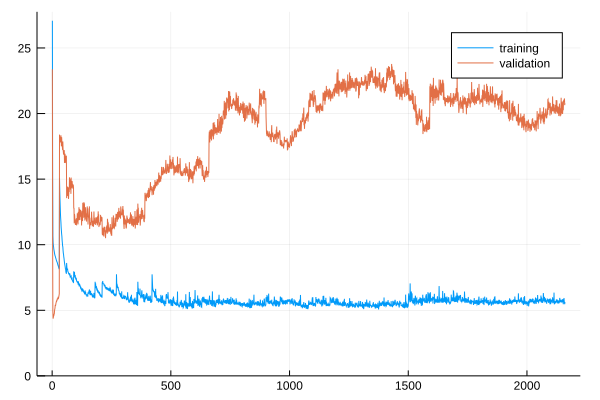

107.454123 seconds (312.77 M allocations: 41.136 GiB, 13.51% gc time)


Progress:  36%|███████████████                          |  ETA: 12:07:36

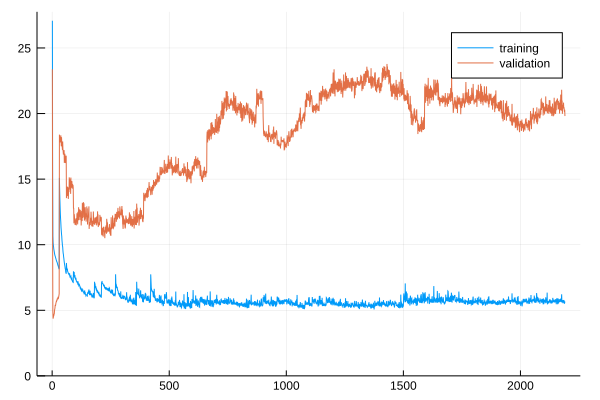

109.785158 seconds (317.31 M allocations: 41.733 GiB, 13.96% gc time)


Progress:  36%|███████████████                          |  ETA: 12:04:18

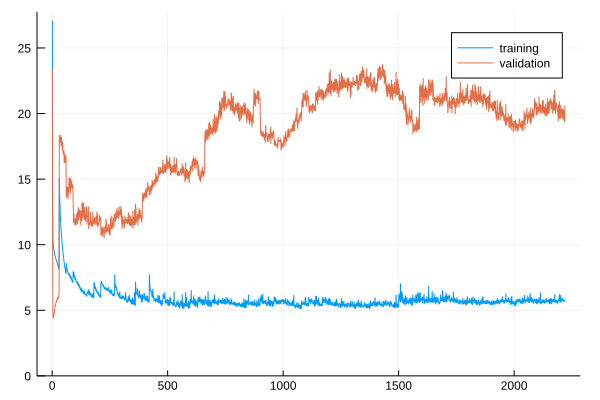

111.140320 seconds (321.78 M allocations: 42.321 GiB, 14.17% gc time)


Progress:  37%|███████████████                          |  ETA: 12:00:57

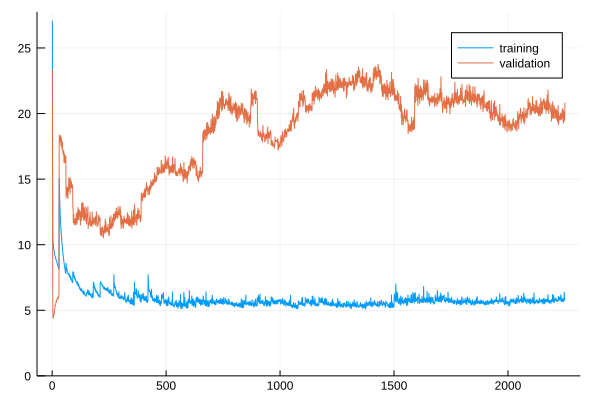

112.772627 seconds (326.32 M allocations: 42.918 GiB, 13.69% gc time)


Progress:  38%|███████████████                          |  ETA: 11:57:08

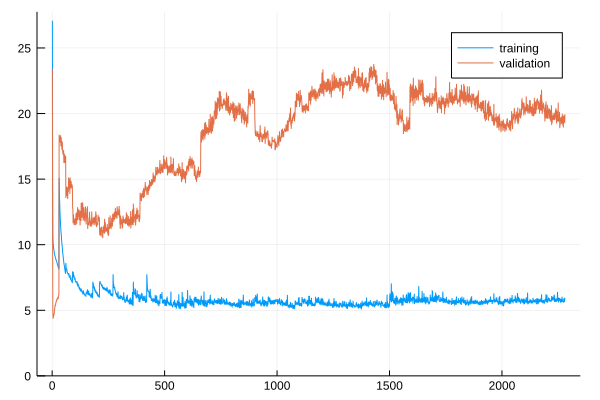

114.125063 seconds (330.39 M allocations: 43.455 GiB, 13.86% gc time)


Progress:  38%|████████████████                         |  ETA: 11:52:26

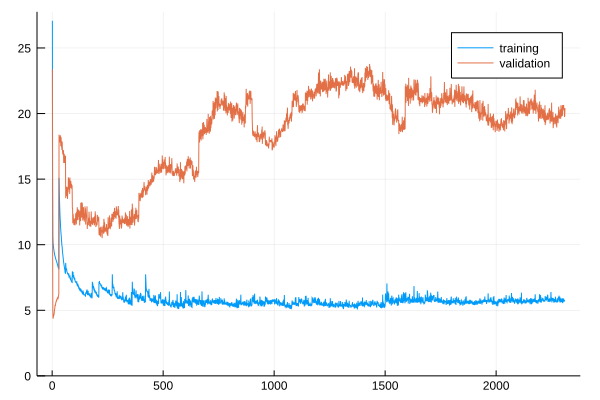

115.186473 seconds (334.93 M allocations: 44.052 GiB, 13.77% gc time)


Progress:  38%|████████████████                         |  ETA: 11:48:38

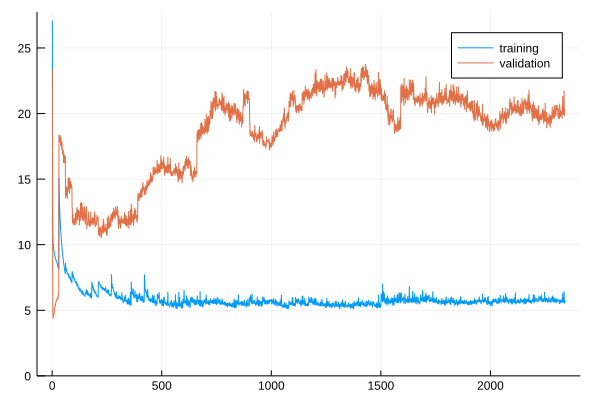

116.592012 seconds (339.47 M allocations: 44.650 GiB, 13.79% gc time)


Progress:  39%|████████████████                         |  ETA: 11:44:48

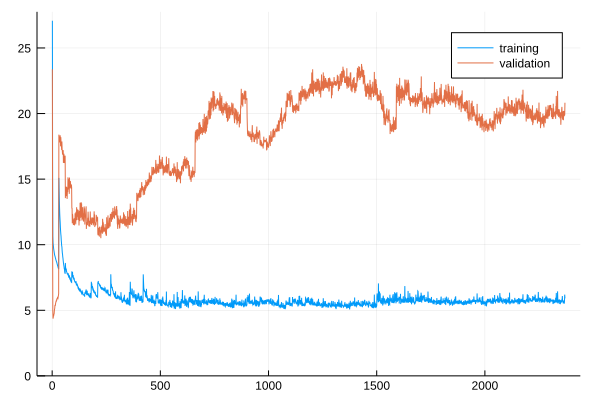

119.058151 seconds (343.00 M allocations: 45.116 GiB, 13.89% gc time)


Progress:  40%|████████████████                         |  ETA: 11:39:39

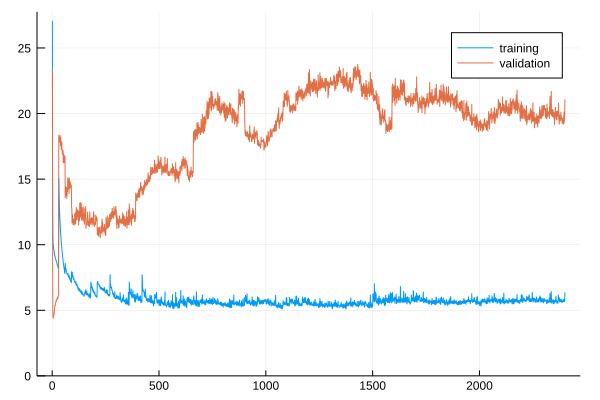

119.174309 seconds (347.15 M allocations: 45.663 GiB, 13.68% gc time)


Progress:  40%|████████████████                         |  ETA: 11:35:11

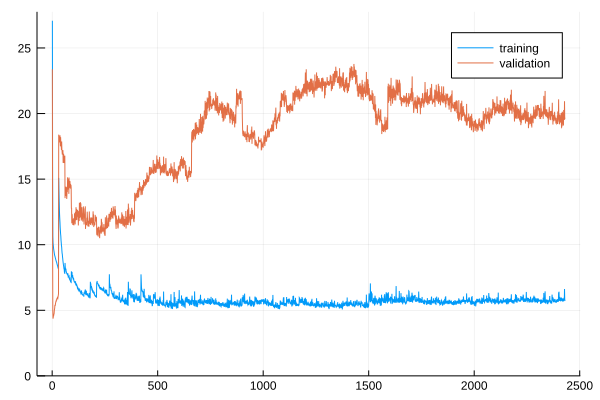

119.346353 seconds (351.45 M allocations: 46.230 GiB, 13.37% gc time)


Progress:  40%|█████████████████                        |  ETA: 11:30:38

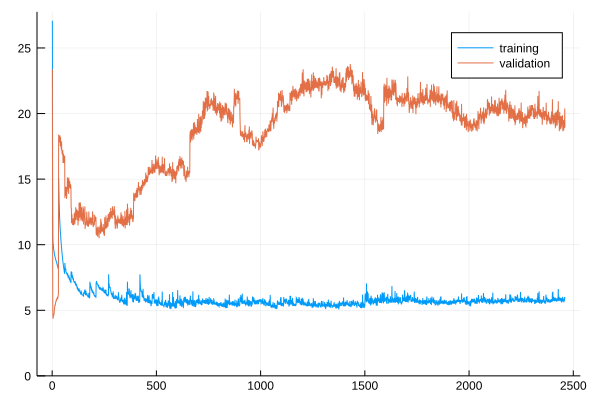

122.721493 seconds (354.90 M allocations: 46.686 GiB, 13.62% gc time)


Progress:  41%|█████████████████                        |  ETA: 11:25:22

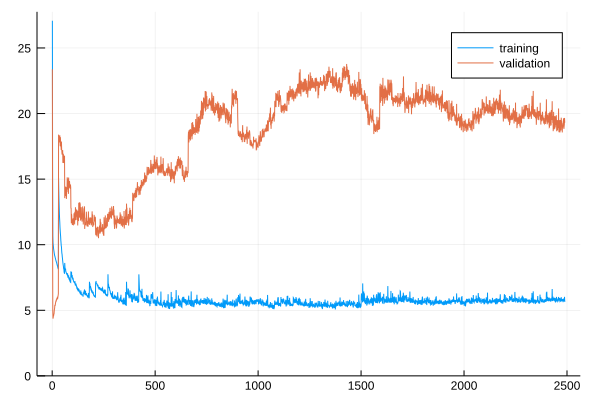

123.736028 seconds (359.44 M allocations: 47.283 GiB, 13.81% gc time)


Progress:  42%|█████████████████                        |  ETA: 11:21:20

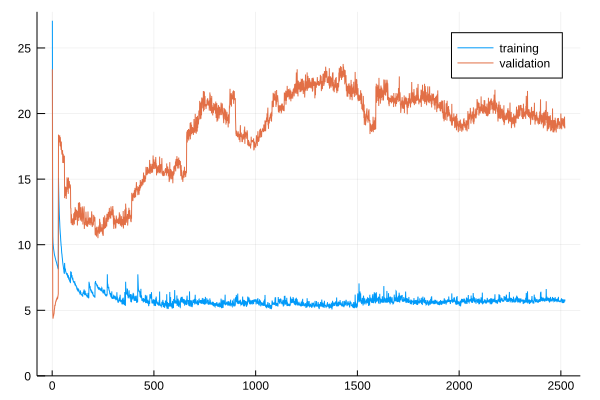

125.345392 seconds (363.98 M allocations: 47.881 GiB, 13.68% gc time)


Progress:  42%|█████████████████                        |  ETA: 11:16:56

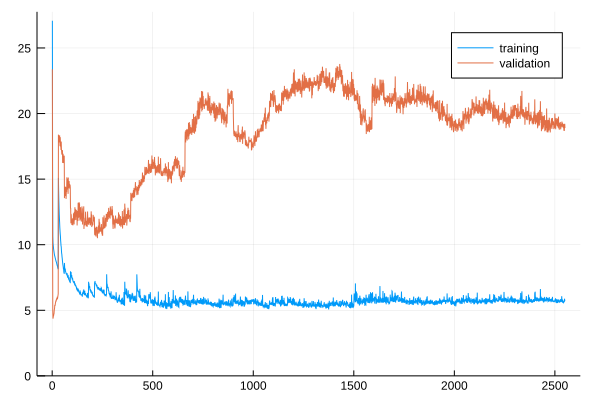

125.922789 seconds (368.29 M allocations: 48.448 GiB, 13.50% gc time)


Progress:  42%|█████████████████                        |  ETA: 11:12:41

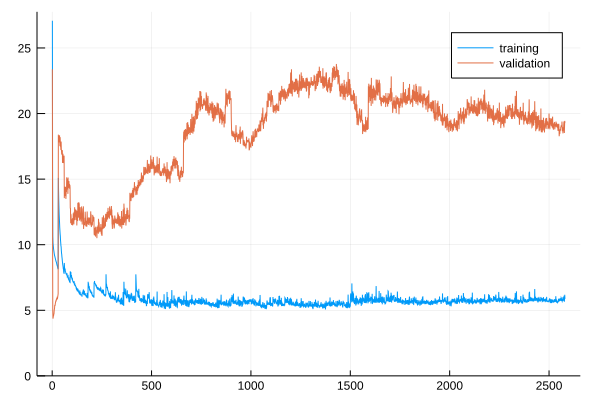

128.836034 seconds (372.53 M allocations: 49.001 GiB, 14.17% gc time)


Progress:  43%|██████████████████                       |  ETA: 11:07:23

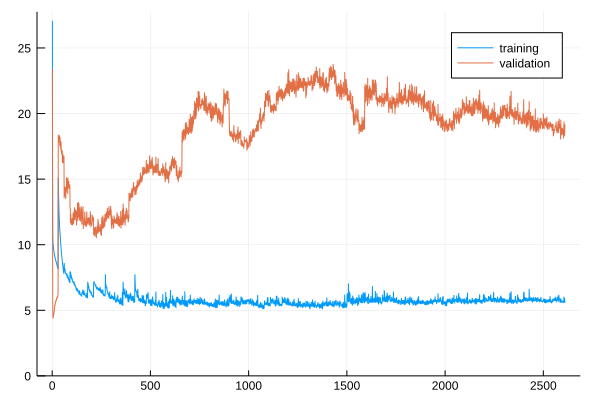

130.051697 seconds (377.08 M allocations: 49.599 GiB, 13.96% gc time)


Progress:  44%|██████████████████                       |  ETA: 11:02:56

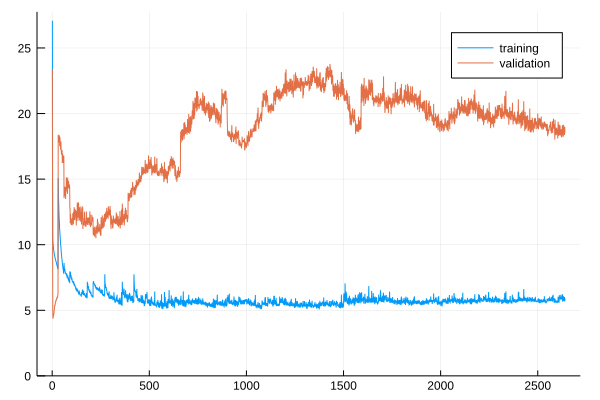

131.316394 seconds (380.36 M allocations: 50.034 GiB, 13.88% gc time)


Progress:  44%|██████████████████                       |  ETA: 10:57:35

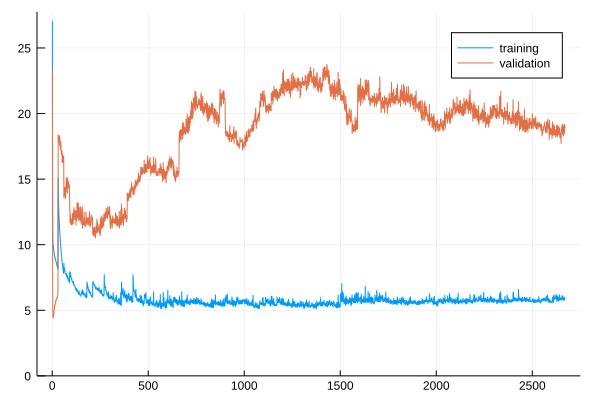

131.869741 seconds (383.57 M allocations: 50.460 GiB, 13.90% gc time)


Progress:  44%|██████████████████                       |  ETA: 10:51:53

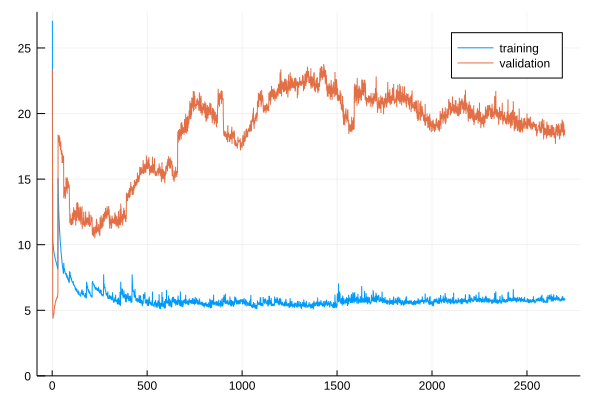

133.694778 seconds (388.12 M allocations: 51.057 GiB, 13.86% gc time)


Progress:  45%|██████████████████                       |  ETA: 10:47:42

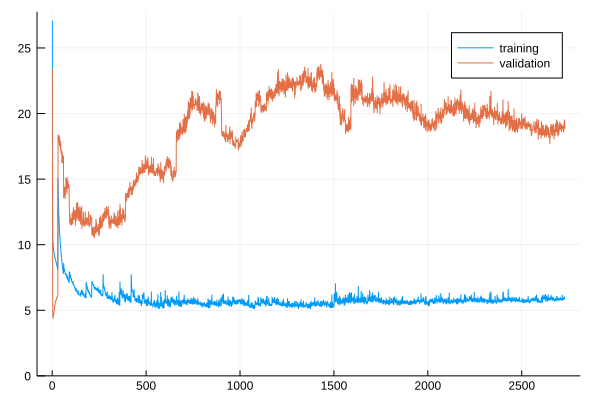

135.281399 seconds (392.61 M allocations: 51.647 GiB, 13.77% gc time)


Progress:  46%|███████████████████                      |  ETA: 10:43:21

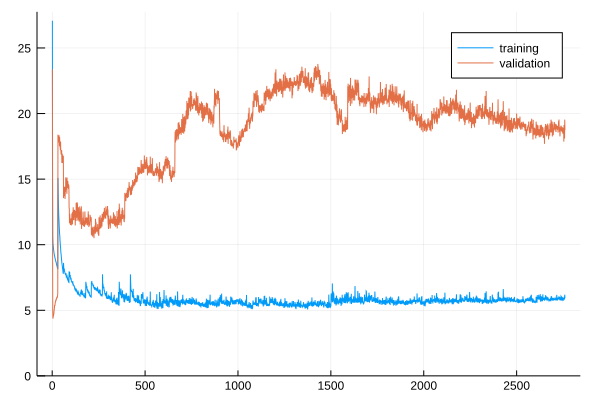

137.015871 seconds (397.15 M allocations: 52.245 GiB, 13.87% gc time)


Progress:  46%|███████████████████                      |  ETA: 10:39:04

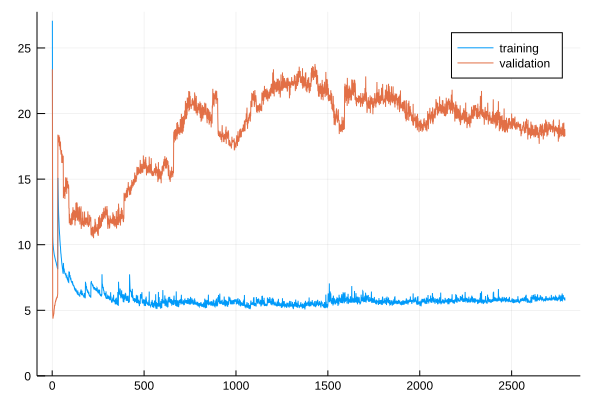

139.869903 seconds (401.69 M allocations: 52.842 GiB, 13.92% gc time)


Progress:  46%|███████████████████                      |  ETA: 10:34:52

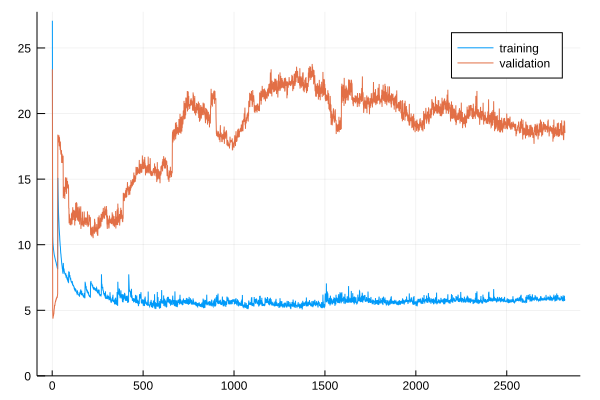

140.290529 seconds (406.23 M allocations: 53.440 GiB, 13.80% gc time)


Progress:  47%|███████████████████                      |  ETA: 10:30:07

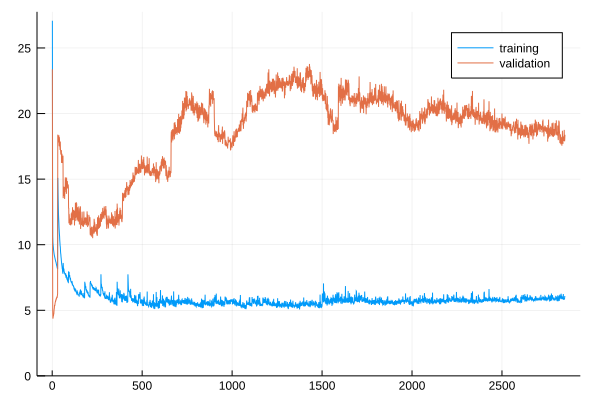

142.067606 seconds (410.31 M allocations: 53.977 GiB, 13.78% gc time)


Progress:  48%|███████████████████                      |  ETA: 10:25:30

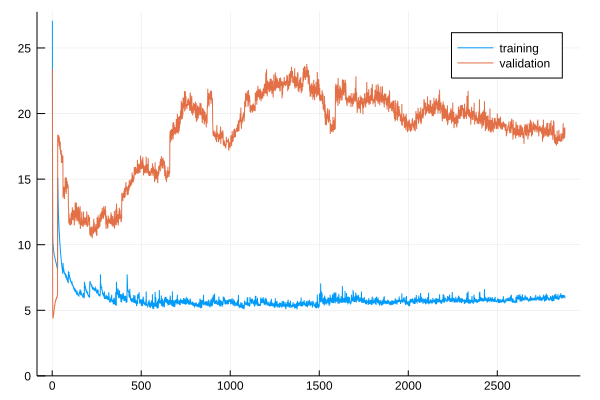

143.297457 seconds (414.85 M allocations: 54.574 GiB, 13.85% gc time)


Progress:  48%|████████████████████                     |  ETA: 10:21:12

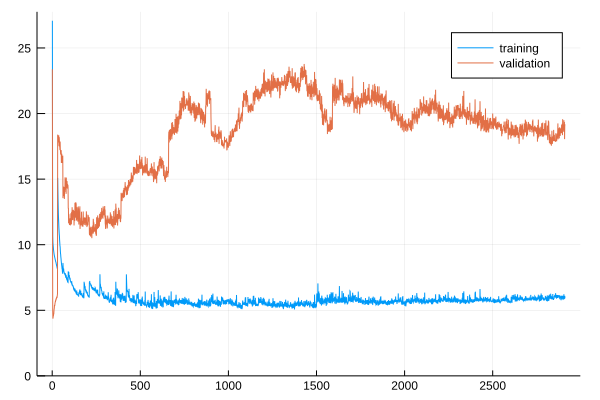

144.351317 seconds (419.39 M allocations: 55.172 GiB, 13.90% gc time)


Progress:  48%|████████████████████                     |  ETA: 10:16:26

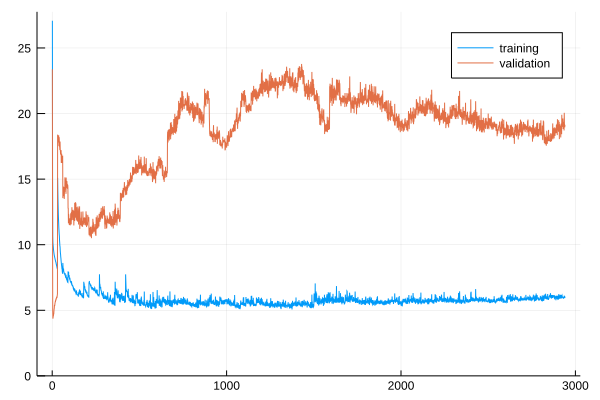

146.623713 seconds (423.93 M allocations: 55.769 GiB, 13.86% gc time)


Progress:  49%|████████████████████                     |  ETA: 10:12:03

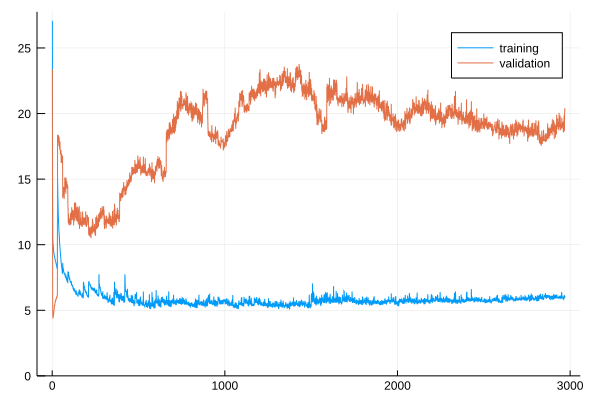

149.015176 seconds (428.47 M allocations: 56.367 GiB, 13.89% gc time)


Progress:  50%|████████████████████                     |  ETA: 10:07:39

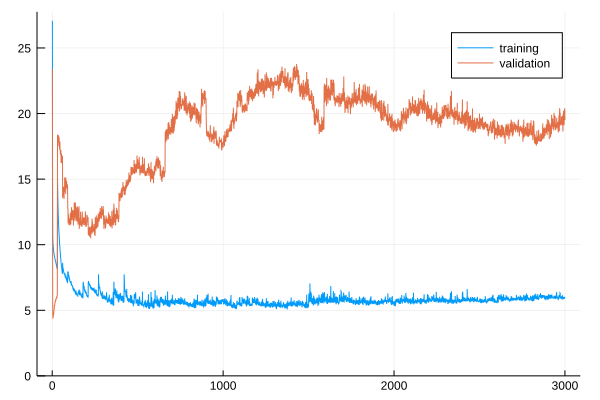

149.401163 seconds (433.02 M allocations: 56.964 GiB, 13.84% gc time)


Progress:  50%|████████████████████                     |  ETA: 10:03:04

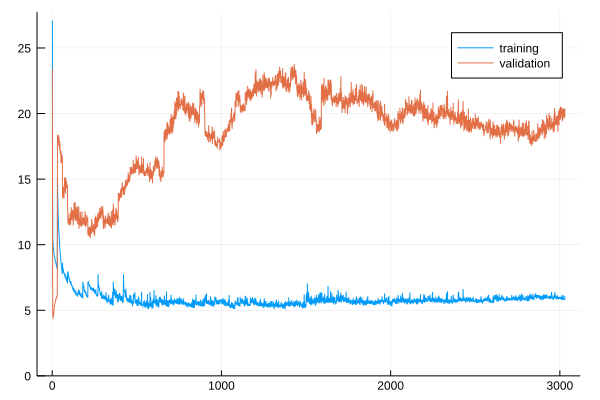

151.585240 seconds (437.56 M allocations: 57.562 GiB, 13.86% gc time)


Progress:  50%|█████████████████████                    |  ETA: 9:58:31

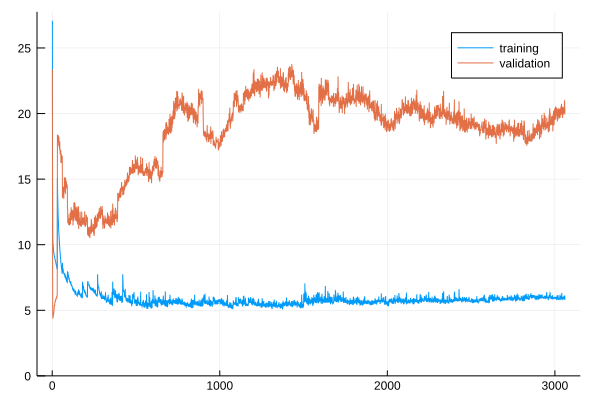

153.146284 seconds (442.10 M allocations: 58.159 GiB, 13.94% gc time)


Progress:  51%|█████████████████████                    |  ETA: 9:53:55

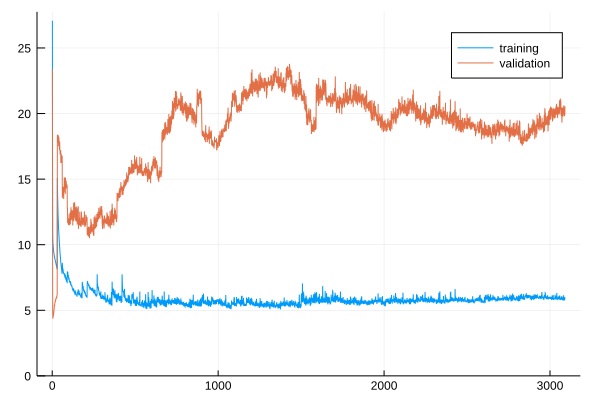

154.564075 seconds (446.64 M allocations: 58.757 GiB, 13.93% gc time)


Progress:  52%|█████████████████████                    |  ETA: 9:49:04

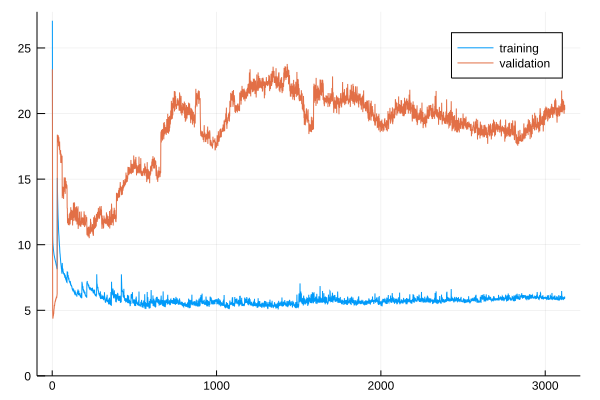

155.146969 seconds (450.57 M allocations: 59.270 GiB, 13.95% gc time)


Progress:  52%|█████████████████████                    |  ETA: 9:43:28

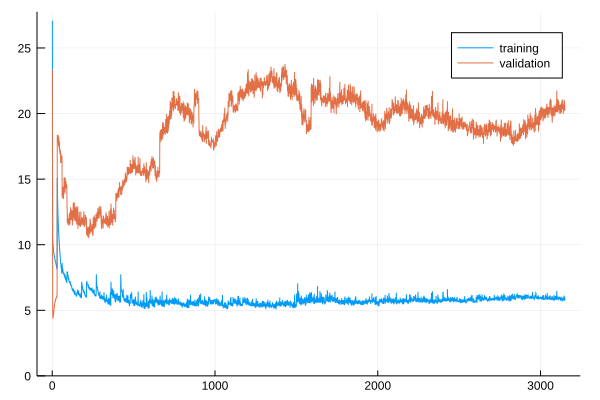

157.177907 seconds (455.11 M allocations: 59.867 GiB, 13.95% gc time)


Progress:  52%|██████████████████████                   |  ETA: 9:38:46

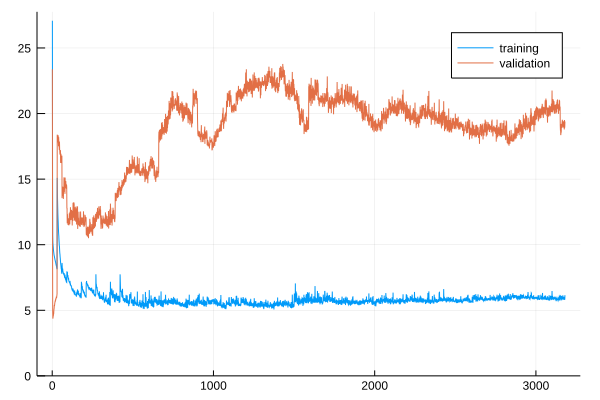

159.484557 seconds (459.42 M allocations: 60.434 GiB, 13.88% gc time)


Progress:  53%|██████████████████████                   |  ETA: 9:33:51

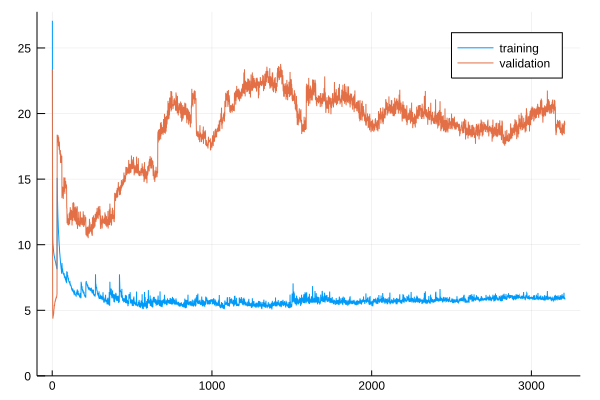

160.196425 seconds (463.88 M allocations: 61.022 GiB, 14.08% gc time)


Progress:  54%|██████████████████████                   |  ETA: 9:29:03

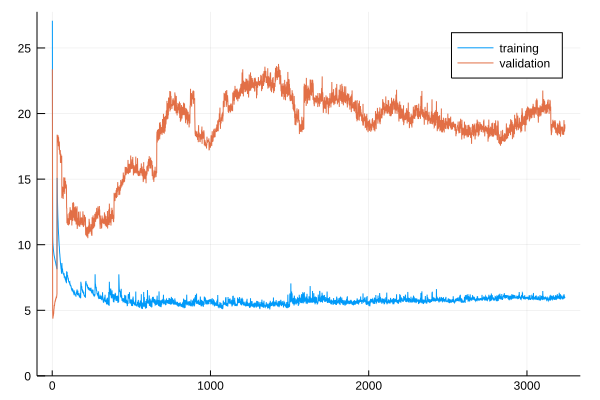

162.981830 seconds (468.27 M allocations: 61.599 GiB, 13.73% gc time)


Progress:  54%|██████████████████████                   |  ETA: 9:24:17

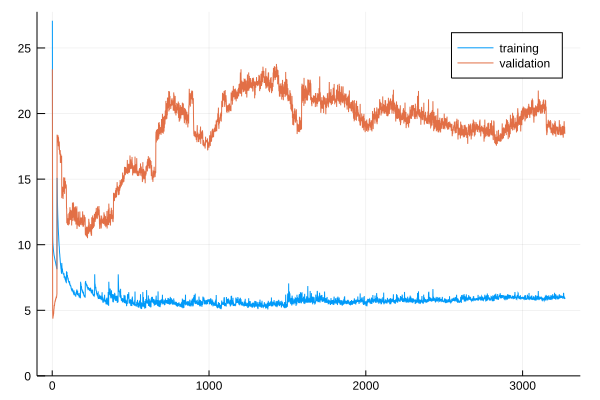

162.431467 seconds (472.34 M allocations: 62.136 GiB, 13.89% gc time)


Progress:  54%|██████████████████████                   |  ETA: 9:19:13

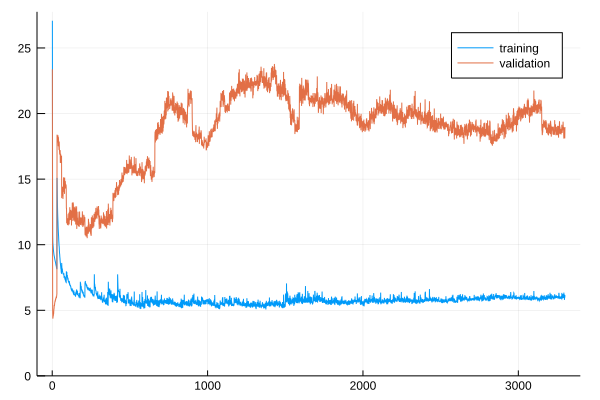

165.925426 seconds (476.26 M allocations: 62.652 GiB, 13.72% gc time)


Progress:  55%|███████████████████████                  |  ETA: 9:13:42

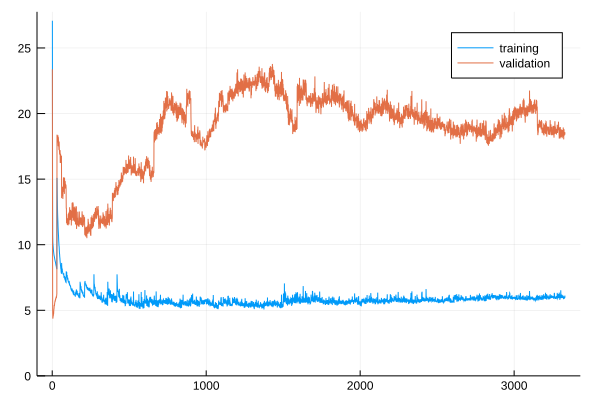

166.217823 seconds (480.25 M allocations: 63.179 GiB, 13.82% gc time)


Progress:  56%|███████████████████████                  |  ETA: 9:08:32

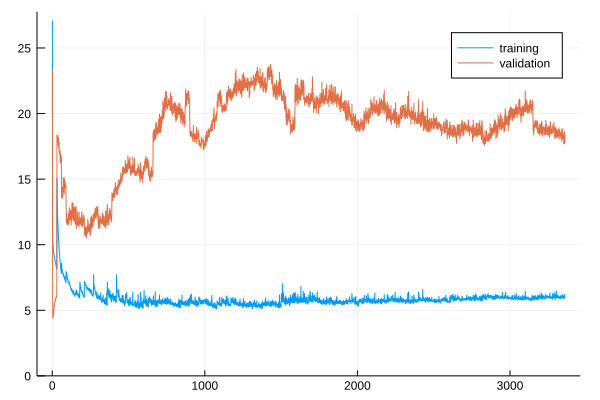

167.764057 seconds (484.79 M allocations: 63.776 GiB, 13.79% gc time)


Progress:  56%|███████████████████████                  |  ETA: 9:03:29

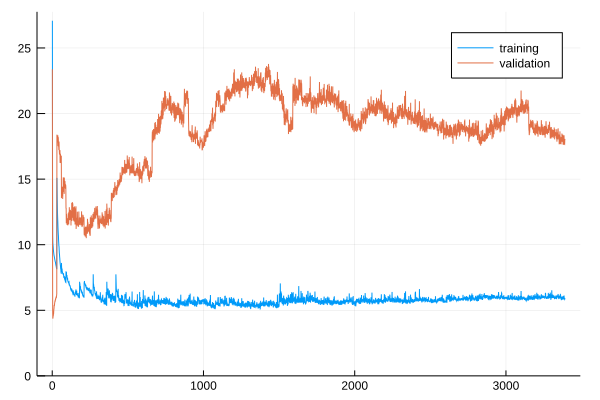

170.511111 seconds (489.33 M allocations: 64.374 GiB, 13.81% gc time)


Progress:  56%|███████████████████████                  |  ETA: 8:58:23

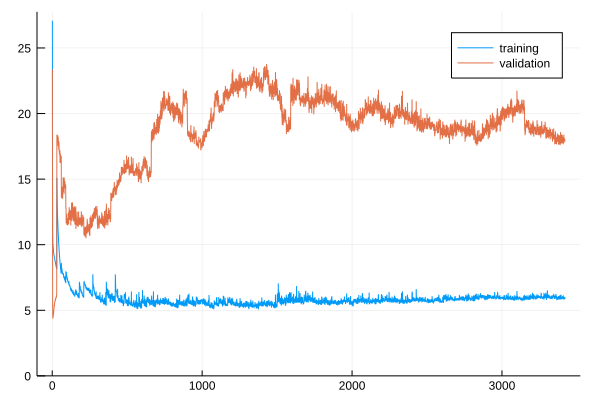

170.603503 seconds (493.88 M allocations: 64.971 GiB, 13.92% gc time)


Progress:  57%|███████████████████████                  |  ETA: 8:53:32

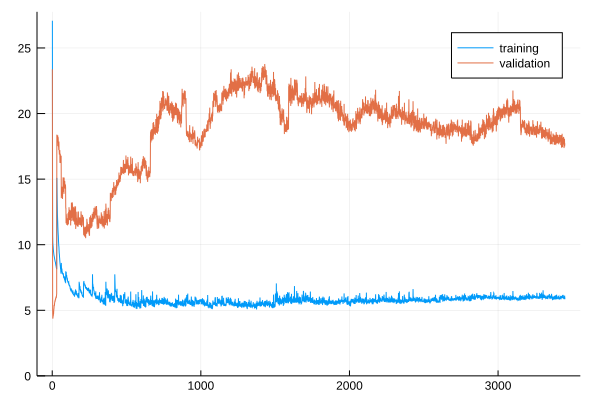

172.339311 seconds (498.42 M allocations: 65.569 GiB, 13.87% gc time)


Progress:  58%|████████████████████████                 |  ETA: 8:48:28

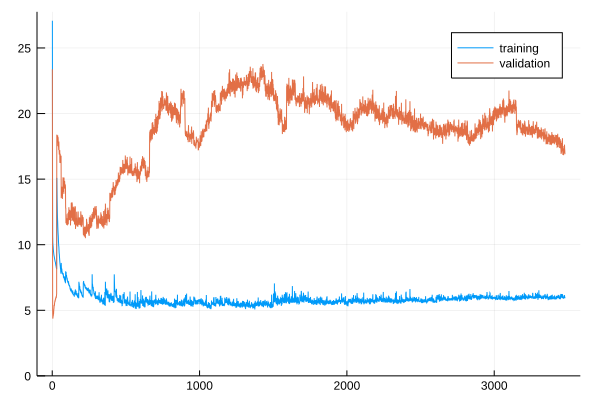

173.738398 seconds (502.96 M allocations: 66.166 GiB, 13.81% gc time)


Progress:  58%|████████████████████████                 |  ETA: 8:43:22

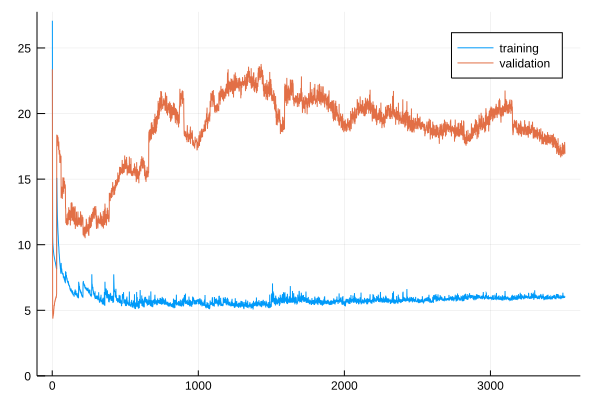

174.071073 seconds (507.50 M allocations: 66.764 GiB, 13.84% gc time)


Progress:  58%|████████████████████████                 |  ETA: 8:38:17

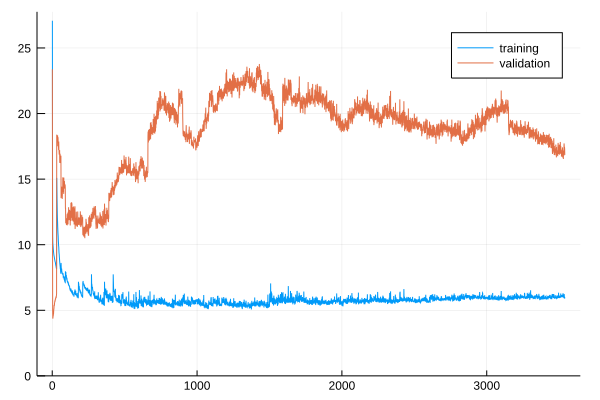

176.559517 seconds (512.04 M allocations: 67.361 GiB, 13.89% gc time)


Progress:  59%|████████████████████████                 |  ETA: 8:33:11

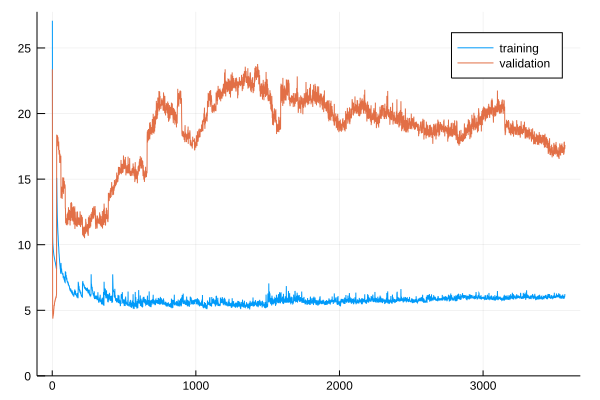

177.959813 seconds (515.65 M allocations: 67.837 GiB, 13.97% gc time)


Progress:  60%|████████████████████████                 |  ETA: 8:27:28

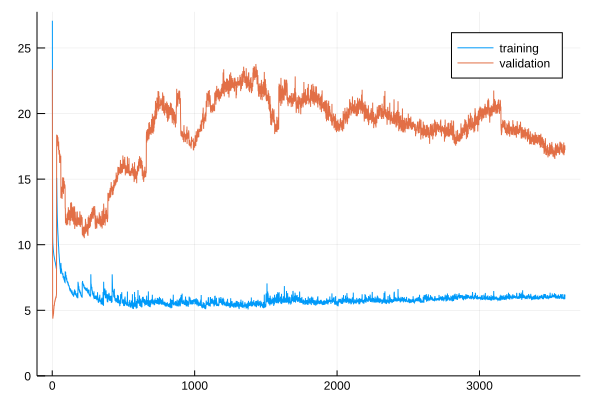

179.865006 seconds (520.19 M allocations: 68.435 GiB, 13.82% gc time)


Progress:  60%|█████████████████████████                |  ETA: 8:22:20

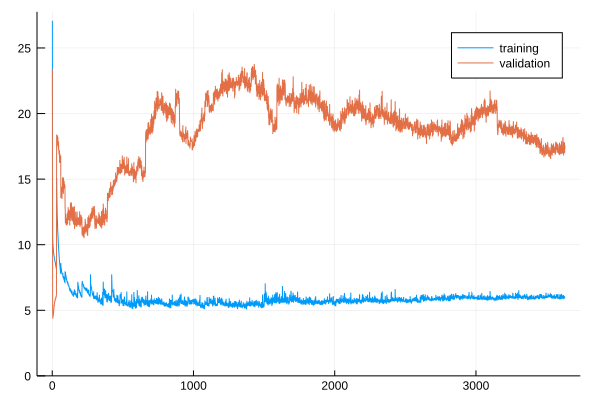

180.346293 seconds (524.70 M allocations: 69.029 GiB, 13.95% gc time)


Progress:  60%|█████████████████████████                |  ETA: 8:17:05

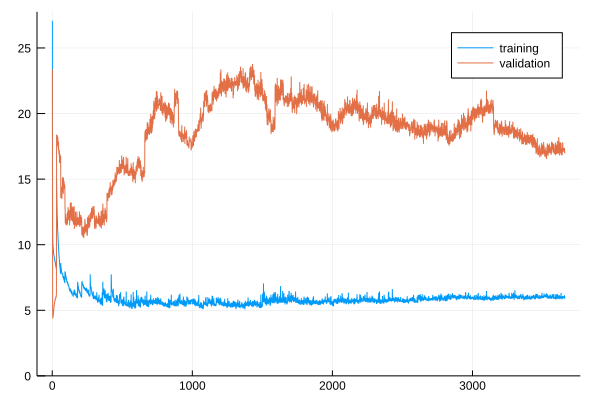

183.025053 seconds (529.25 M allocations: 69.626 GiB, 13.85% gc time)


Progress:  61%|█████████████████████████                |  ETA: 8:11:49

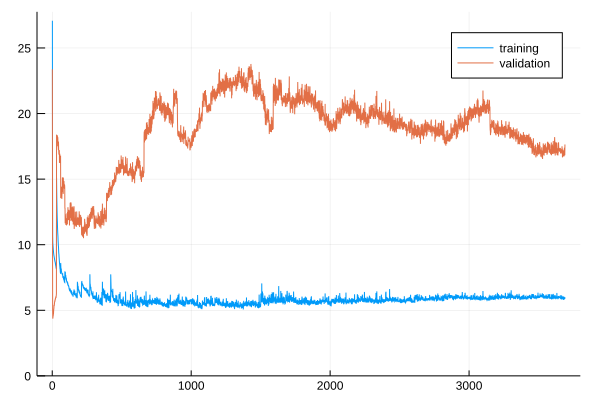

185.469934 seconds (533.79 M allocations: 70.224 GiB, 14.03% gc time)


Progress:  62%|█████████████████████████                |  ETA: 8:06:35

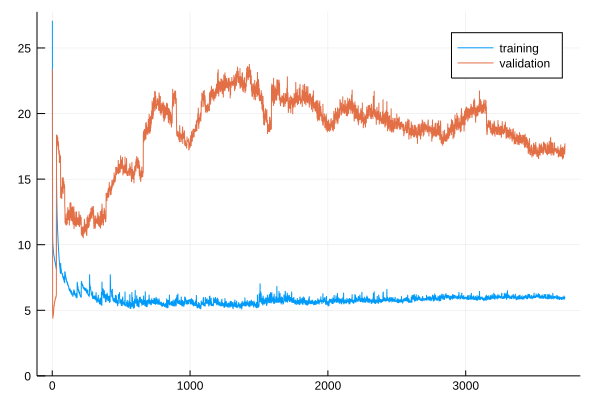

187.001890 seconds (538.33 M allocations: 70.821 GiB, 13.76% gc time)


Progress:  62%|█████████████████████████                |  ETA: 8:01:30

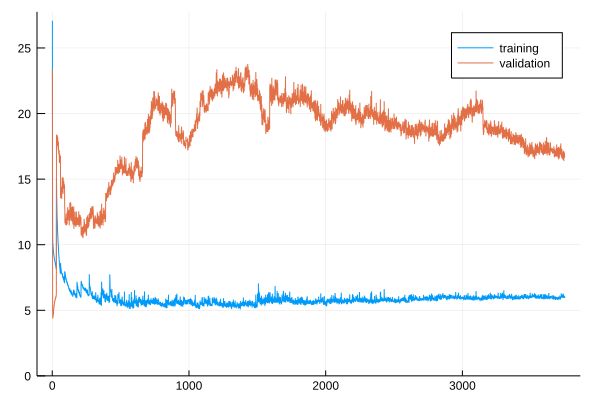

186.877686 seconds (542.14 M allocations: 71.324 GiB, 14.05% gc time)


Progress:  62%|██████████████████████████               |  ETA: 7:55:53

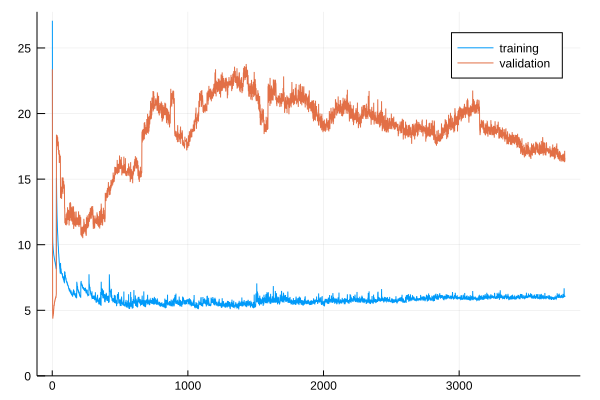

188.672639 seconds (546.68 M allocations: 71.921 GiB, 13.82% gc time)


Progress:  63%|██████████████████████████               |  ETA: 7:50:41

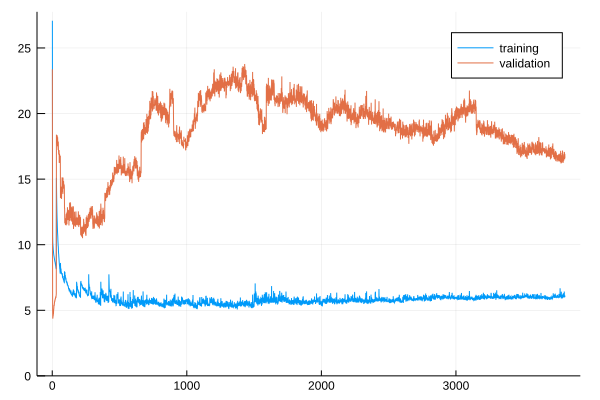

190.459191 seconds (551.23 M allocations: 72.519 GiB, 13.83% gc time)


Progress:  64%|██████████████████████████               |  ETA: 7:45:23

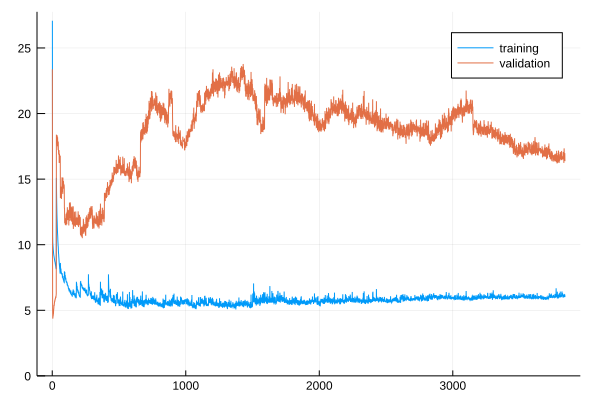

192.158538 seconds (555.77 M allocations: 73.116 GiB, 13.91% gc time)


Progress:  64%|██████████████████████████               |  ETA: 7:40:08

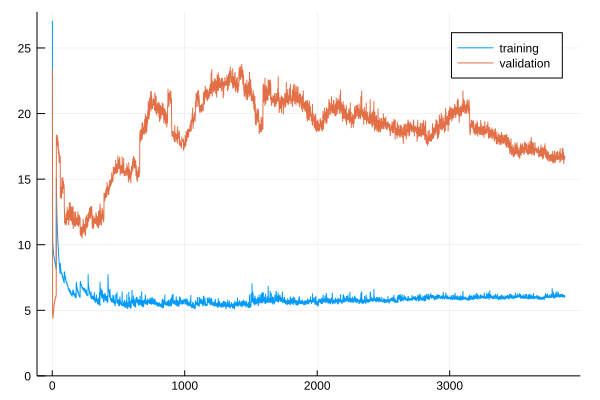

194.816479 seconds (560.31 M allocations: 73.714 GiB, 13.76% gc time)


Progress:  64%|██████████████████████████               |  ETA: 7:34:42

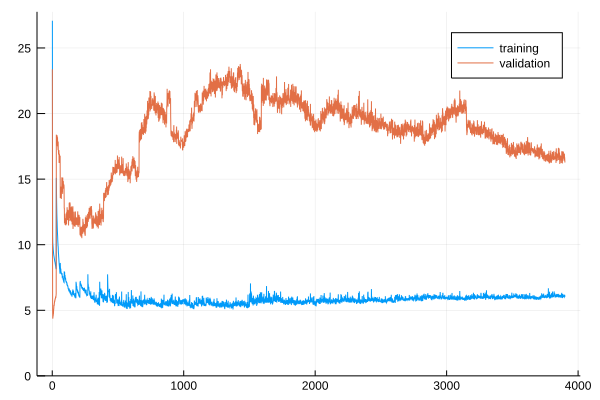

195.345721 seconds (564.85 M allocations: 74.311 GiB, 13.83% gc time)


Progress:  65%|███████████████████████████              |  ETA: 7:29:07

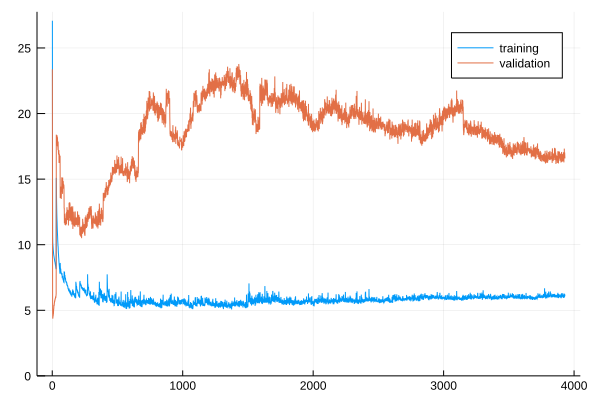

197.774471 seconds (569.39 M allocations: 74.909 GiB, 13.74% gc time)


Progress:  66%|███████████████████████████              |  ETA: 7:23:41

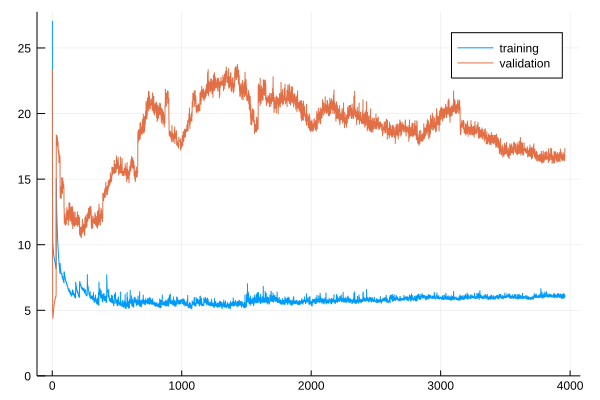

198.592182 seconds (573.94 M allocations: 75.506 GiB, 13.77% gc time)


Progress:  66%|███████████████████████████              |  ETA: 7:18:07

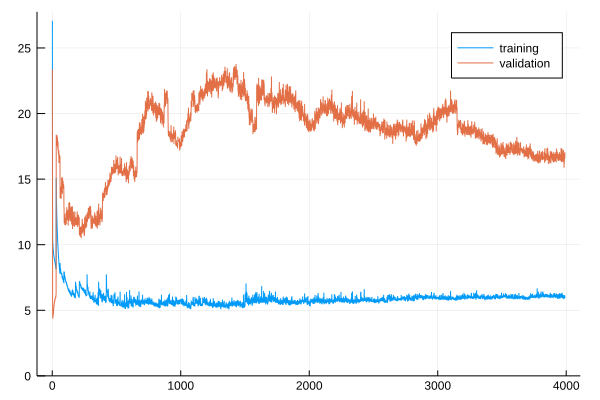

199.624223 seconds (578.48 M allocations: 76.104 GiB, 13.72% gc time)


Progress:  66%|███████████████████████████              |  ETA: 7:12:39

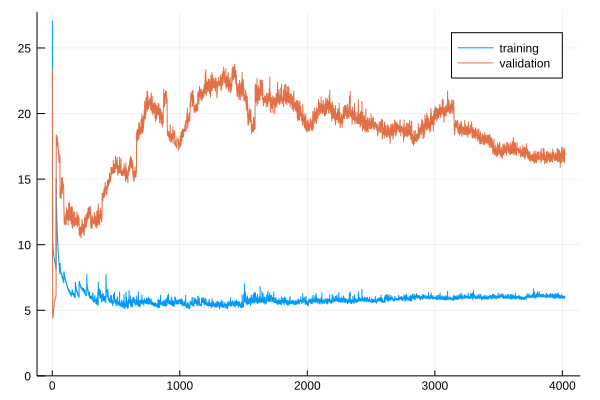

201.294460 seconds (582.75 M allocations: 76.661 GiB, 13.75% gc time)


Progress:  67%|███████████████████████████              |  ETA: 7:06:45

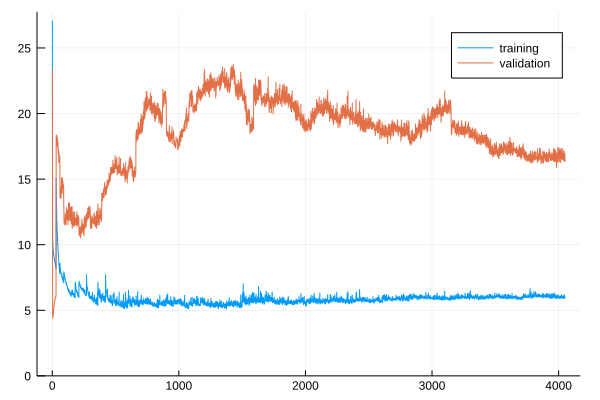

202.116379 seconds (587.29 M allocations: 77.258 GiB, 13.80% gc time)


Progress:  68%|████████████████████████████             |  ETA: 7:01:03

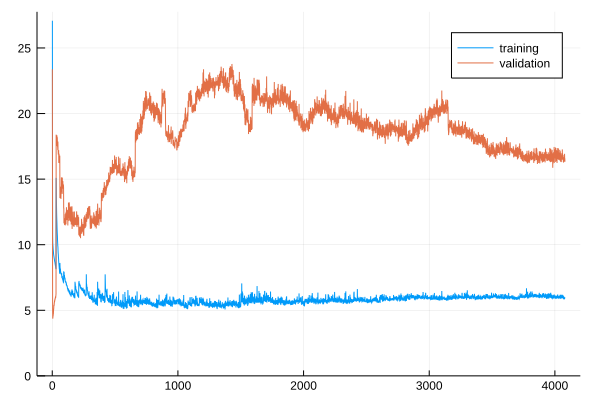

204.188622 seconds (591.83 M allocations: 77.856 GiB, 13.78% gc time)


Progress:  68%|████████████████████████████             |  ETA: 6:55:25

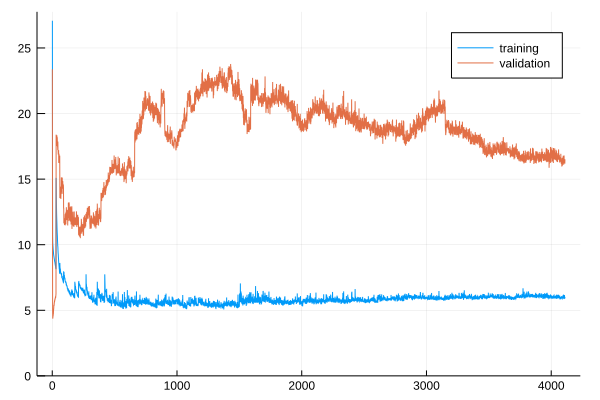

204.983831 seconds (596.37 M allocations: 78.453 GiB, 13.81% gc time)


Progress:  68%|████████████████████████████             |  ETA: 6:49:51

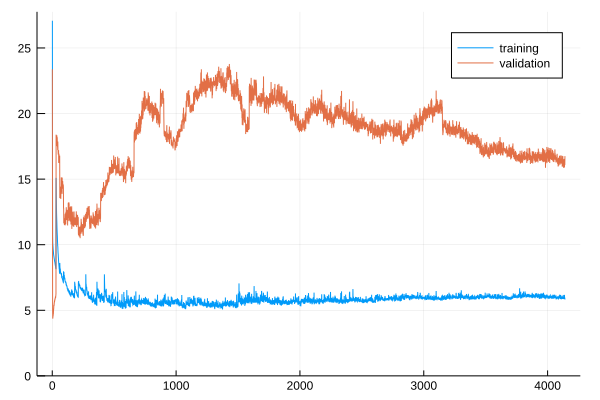

206.490398 seconds (600.91 M allocations: 79.051 GiB, 13.76% gc time)


Progress:  69%|████████████████████████████             |  ETA: 6:44:04

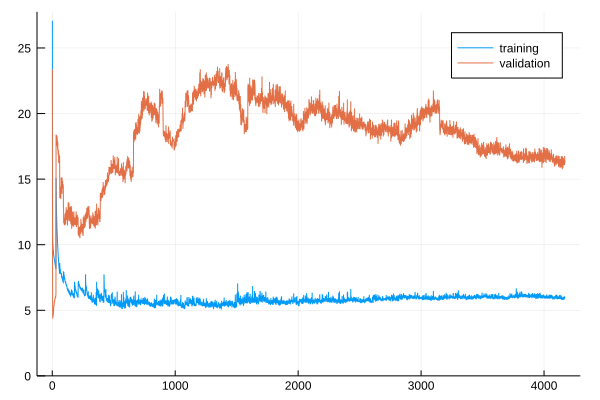

215.829972 seconds (605.46 M allocations: 79.648 GiB, 13.55% gc time)


Progress:  70%|████████████████████████████             |  ETA: 6:38:17

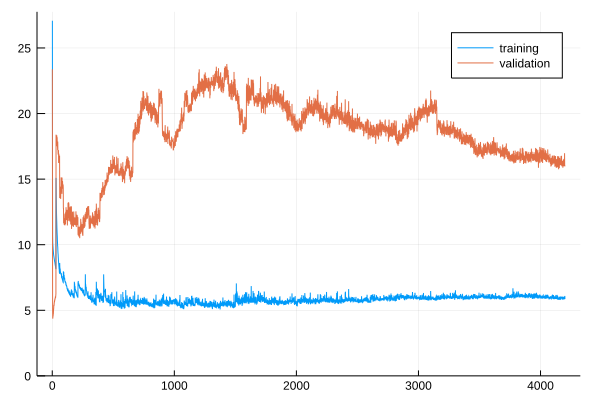

210.223312 seconds (610.00 M allocations: 80.246 GiB, 13.79% gc time)


Progress:  70%|█████████████████████████████            |  ETA: 6:32:31

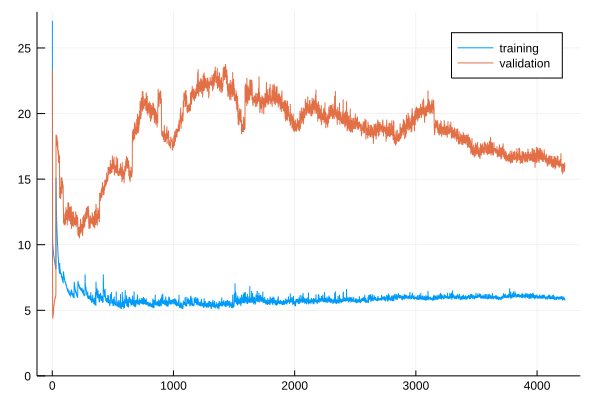

210.899856 seconds (614.54 M allocations: 80.843 GiB, 13.86% gc time)


Progress:  70%|█████████████████████████████            |  ETA: 6:26:43

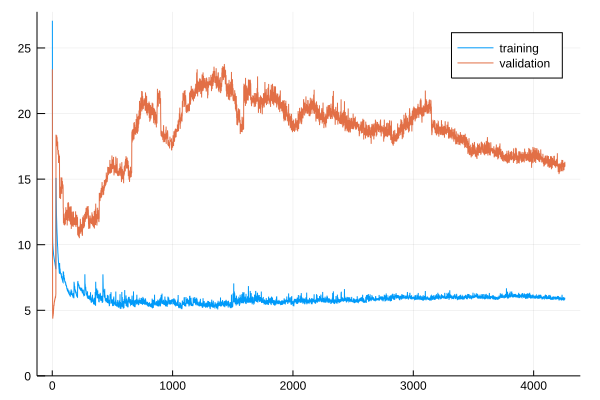

214.004759 seconds (619.08 M allocations: 81.441 GiB, 13.76% gc time)


Progress:  71%|█████████████████████████████            |  ETA: 6:20:53

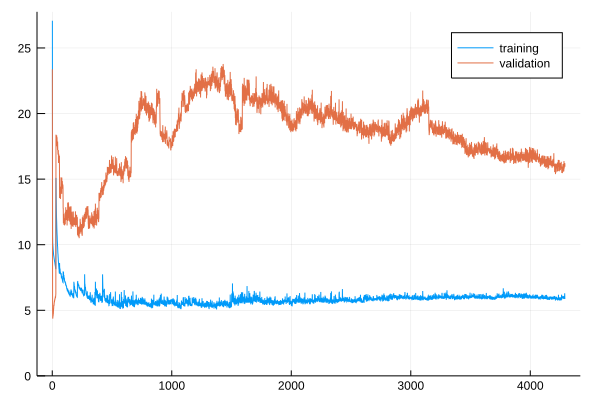

214.719068 seconds (623.62 M allocations: 82.038 GiB, 13.84% gc time)


Progress:  72%|█████████████████████████████            |  ETA: 6:15:13

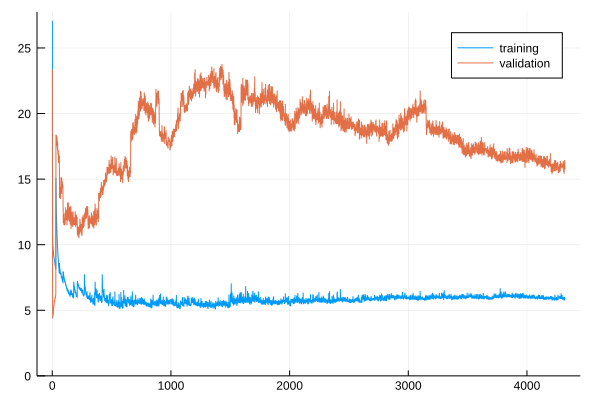

215.111106 seconds (628.09 M allocations: 82.625 GiB, 13.79% gc time)


Progress:  72%|██████████████████████████████           |  ETA: 6:09:24

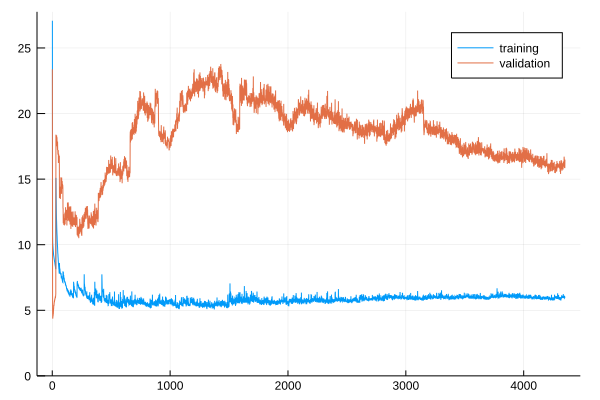

217.177306 seconds (632.63 M allocations: 83.222 GiB, 13.82% gc time)


Progress:  72%|██████████████████████████████           |  ETA: 6:03:41

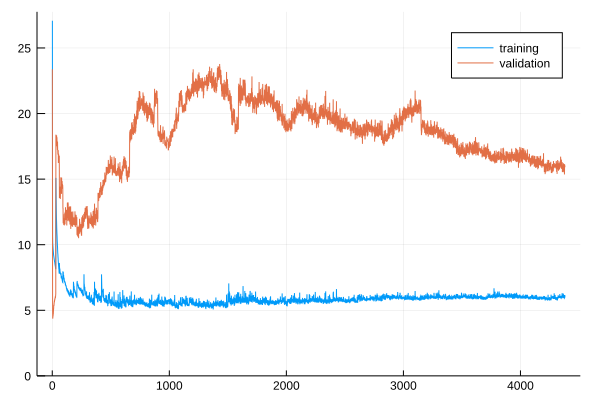

218.368608 seconds (637.17 M allocations: 83.820 GiB, 13.72% gc time)


Progress:  73%|██████████████████████████████           |  ETA: 5:57:51

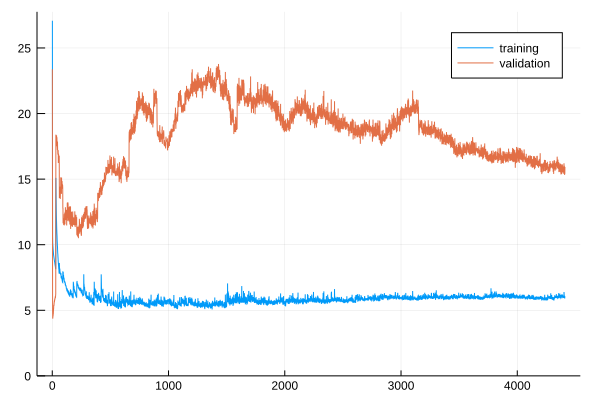

219.257503 seconds (641.72 M allocations: 84.417 GiB, 13.87% gc time)


Progress:  74%|██████████████████████████████           |  ETA: 5:52:01

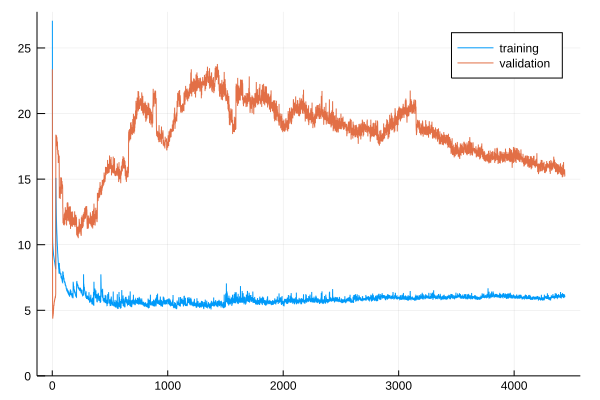

223.971928 seconds (645.48 M allocations: 84.913 GiB, 13.90% gc time)


Progress:  74%|██████████████████████████████           |  ETA: 5:45:49

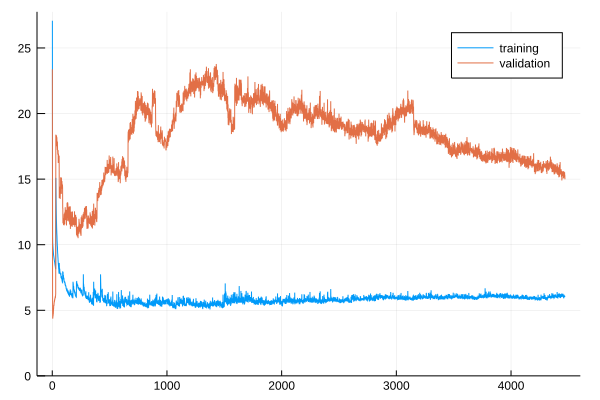

223.583618 seconds (650.02 M allocations: 85.511 GiB, 13.87% gc time)


Progress:  74%|███████████████████████████████          |  ETA: 5:39:50

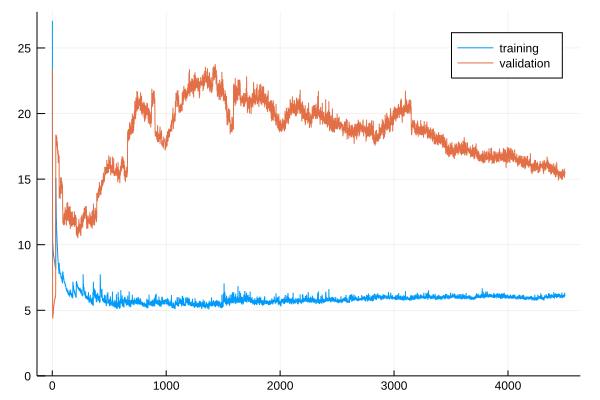

225.189123 seconds (654.56 M allocations: 86.108 GiB, 13.84% gc time)


Progress:  75%|███████████████████████████████          |  ETA: 5:33:48

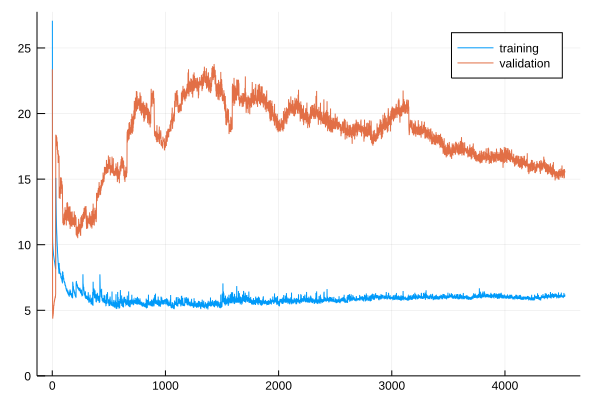

226.348401 seconds (659.10 M allocations: 86.706 GiB, 13.83% gc time)


Progress:  76%|███████████████████████████████          |  ETA: 5:27:50

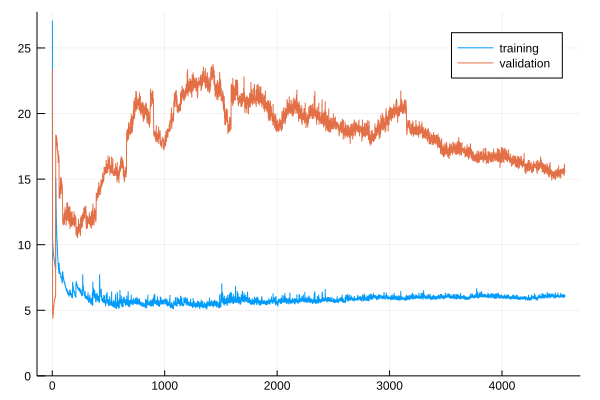

227.973649 seconds (663.64 M allocations: 87.303 GiB, 13.79% gc time)


Progress:  76%|███████████████████████████████          |  ETA: 5:21:51

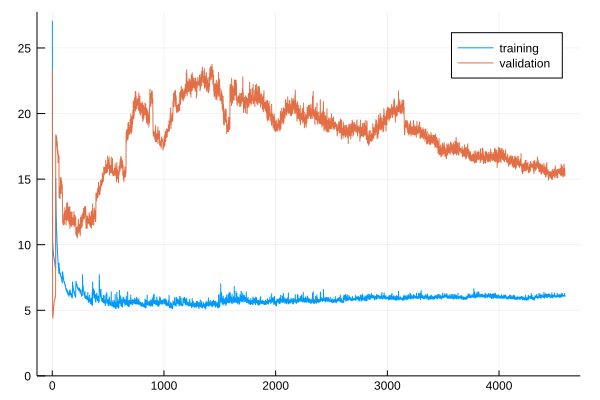

229.014068 seconds (667.95 M allocations: 87.871 GiB, 13.80% gc time)


Progress:  76%|███████████████████████████████          |  ETA: 5:15:42

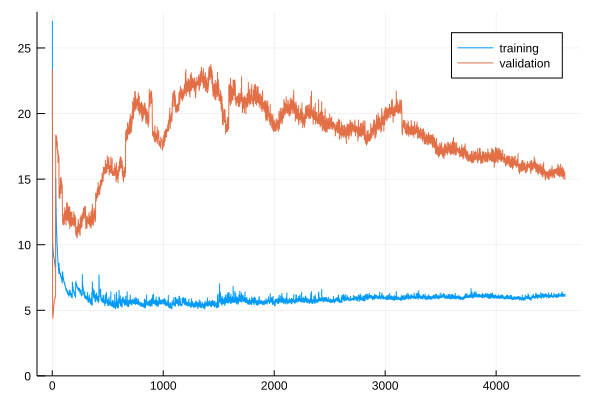

231.516036 seconds (672.49 M allocations: 88.468 GiB, 13.90% gc time)


Progress:  77%|████████████████████████████████         |  ETA: 5:09:37

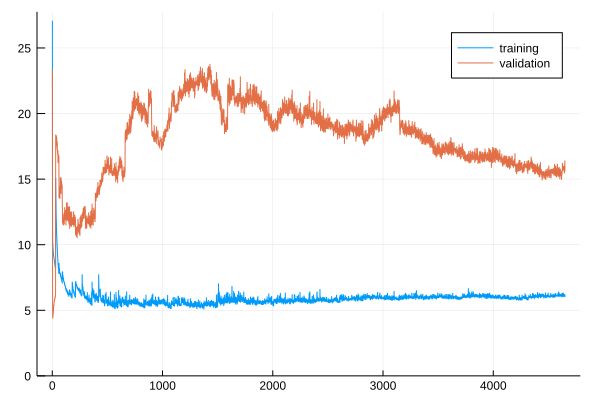

232.914375 seconds (677.03 M allocations: 89.066 GiB, 13.74% gc time)


Progress:  78%|████████████████████████████████         |  ETA: 5:03:28

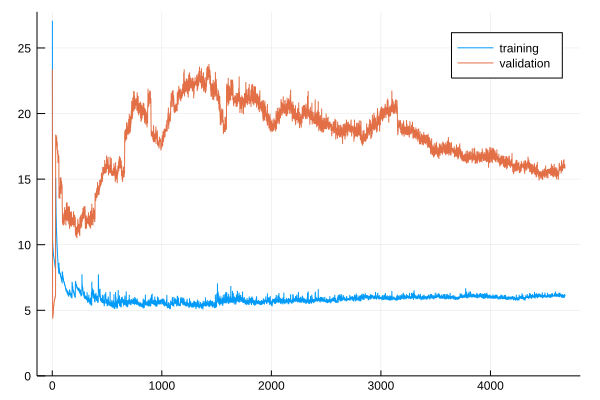

234.425814 seconds (681.58 M allocations: 89.663 GiB, 13.92% gc time)


Progress:  78%|████████████████████████████████         |  ETA: 4:57:20

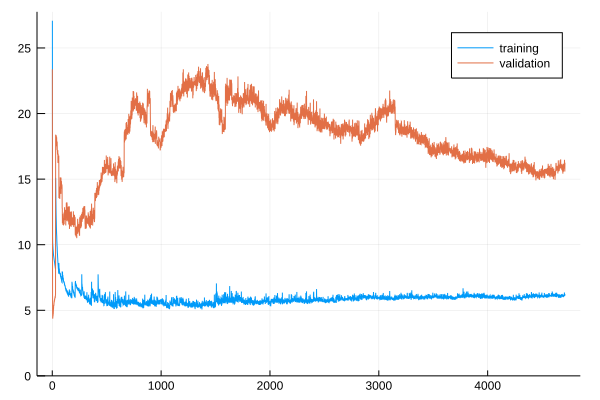

236.095767 seconds (686.12 M allocations: 90.260 GiB, 13.83% gc time)


Progress:  78%|████████████████████████████████         |  ETA: 4:51:11

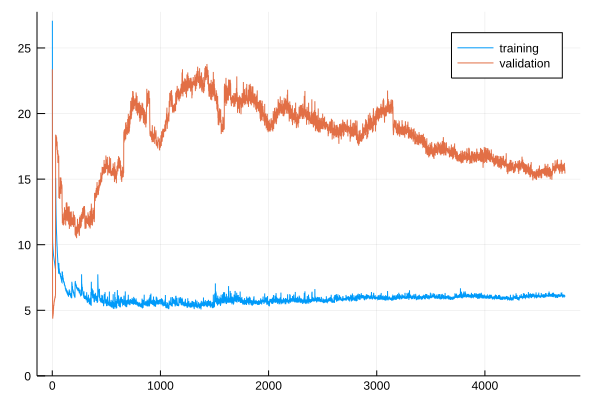

237.104102 seconds (690.66 M allocations: 90.858 GiB, 13.81% gc time)


Progress:  79%|████████████████████████████████         |  ETA: 4:44:54

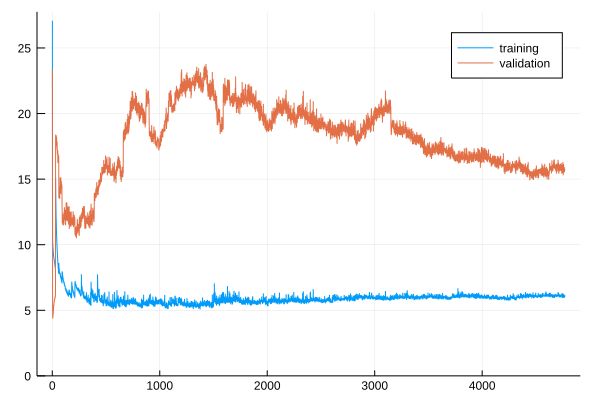

239.577400 seconds (695.20 M allocations: 91.455 GiB, 13.79% gc time)


Progress:  80%|█████████████████████████████████        |  ETA: 4:38:38

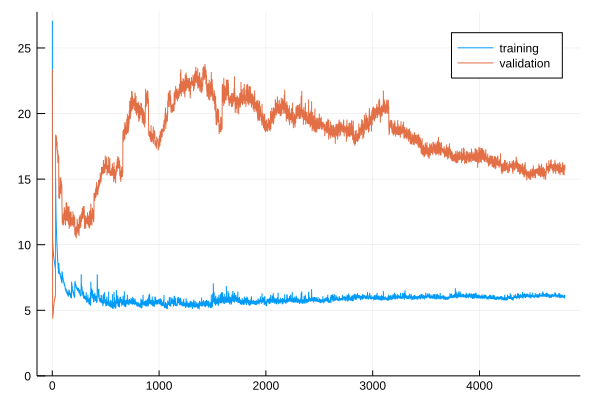

240.315272 seconds (699.20 M allocations: 91.982 GiB, 13.73% gc time)


Progress:  80%|█████████████████████████████████        |  ETA: 4:32:17

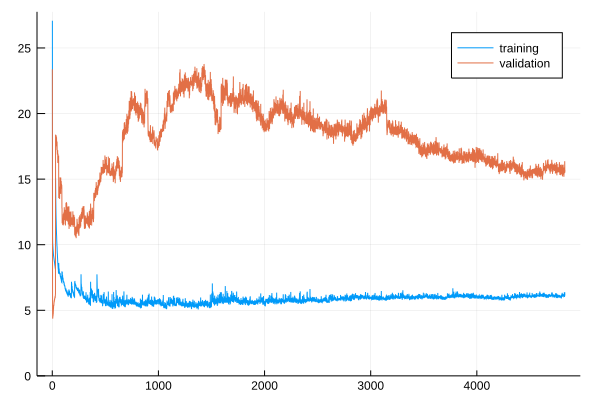

241.789366 seconds (703.66 M allocations: 92.569 GiB, 13.80% gc time)


Progress:  80%|█████████████████████████████████        |  ETA: 4:26:02

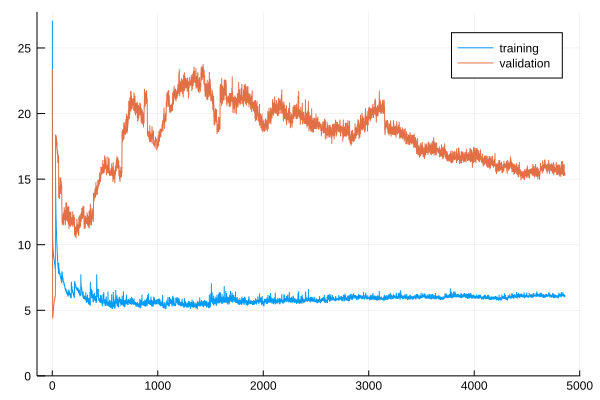

245.659701 seconds (708.20 M allocations: 93.167 GiB, 13.80% gc time)


Progress:  81%|█████████████████████████████████        |  ETA: 4:19:47

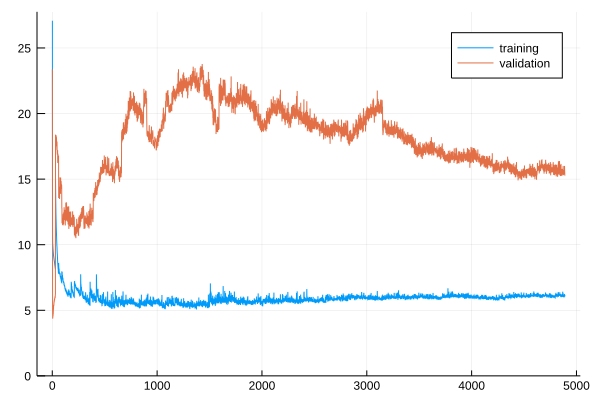

246.364212 seconds (712.51 M allocations: 93.734 GiB, 13.62% gc time)


Progress:  82%|█████████████████████████████████        |  ETA: 4:13:25

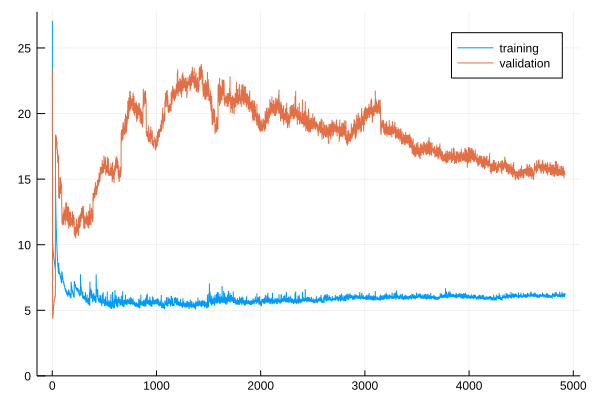

246.057818 seconds (716.89 M allocations: 94.311 GiB, 13.56% gc time)


Progress:  82%|██████████████████████████████████       |  ETA: 4:07:01

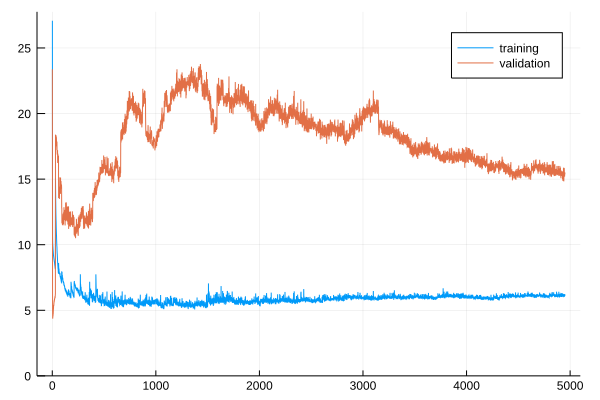

248.622598 seconds (721.44 M allocations: 94.909 GiB, 13.93% gc time)


Progress:  82%|██████████████████████████████████       |  ETA: 4:00:38

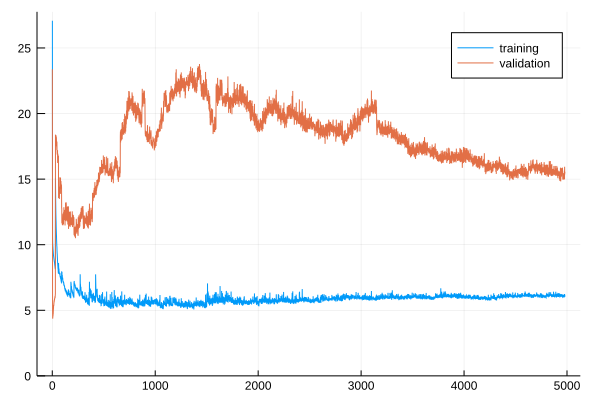

249.554598 seconds (725.98 M allocations: 95.506 GiB, 13.86% gc time)


Progress:  83%|██████████████████████████████████       |  ETA: 3:54:07

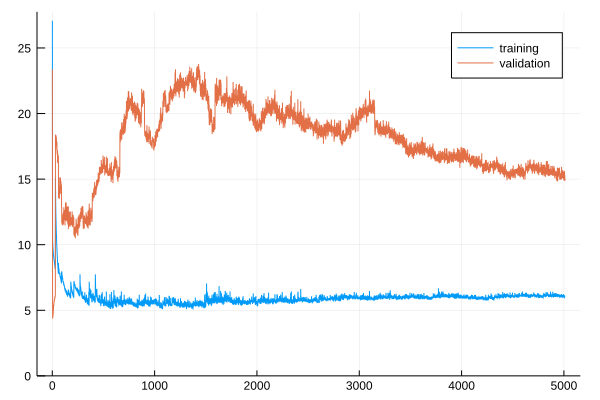

252.092160 seconds (730.28 M allocations: 96.073 GiB, 13.71% gc time)


Progress:  84%|██████████████████████████████████       |  ETA: 3:47:39

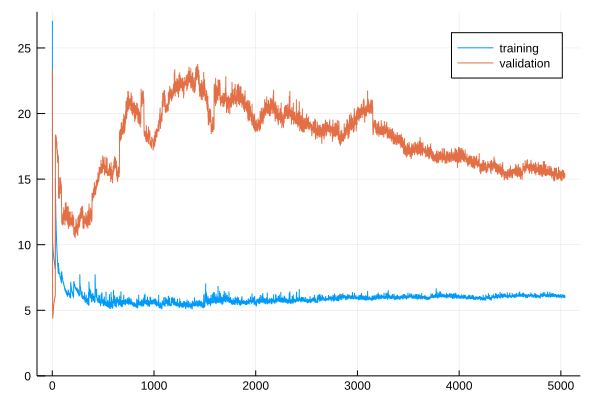

253.955821 seconds (734.83 M allocations: 96.671 GiB, 13.87% gc time)


Progress:  84%|██████████████████████████████████       |  ETA: 3:41:14

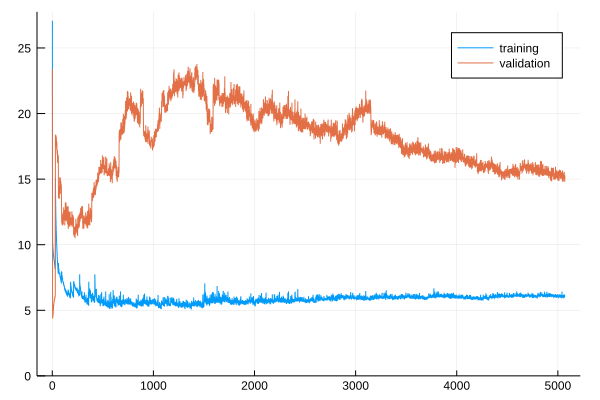

254.819119 seconds (739.37 M allocations: 97.268 GiB, 13.87% gc time)


Progress:  84%|███████████████████████████████████      |  ETA: 3:34:47

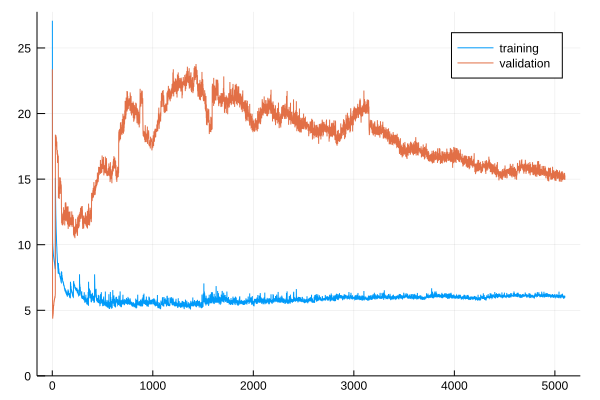

257.893929 seconds (743.91 M allocations: 97.866 GiB, 13.73% gc time)


Progress:  85%|███████████████████████████████████      |  ETA: 3:28:15

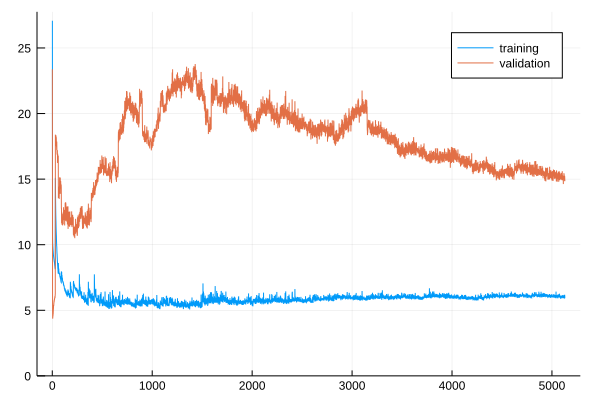

259.768202 seconds (748.45 M allocations: 98.463 GiB, 13.89% gc time)


Progress:  86%|███████████████████████████████████      |  ETA: 3:21:43

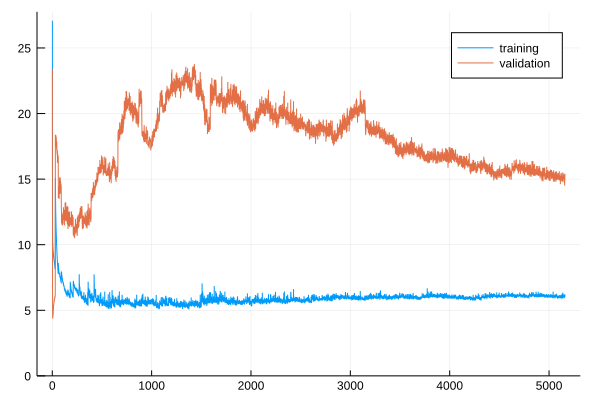

260.893440 seconds (752.84 M allocations: 99.041 GiB, 13.82% gc time)


Progress:  86%|███████████████████████████████████      |  ETA: 3:15:09

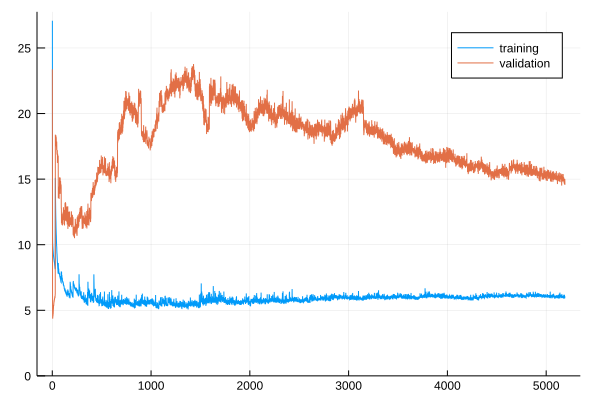

261.181321 seconds (756.44 M allocations: 99.517 GiB, 13.82% gc time)


Progress:  86%|███████████████████████████████████      |  ETA: 3:08:26

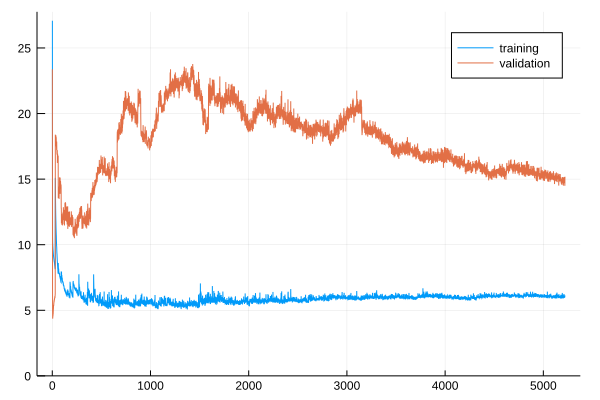

262.483869 seconds (760.98 M allocations: 100.114 GiB, 13.78% gc time)


Progress:  87%|████████████████████████████████████     |  ETA: 3:01:49

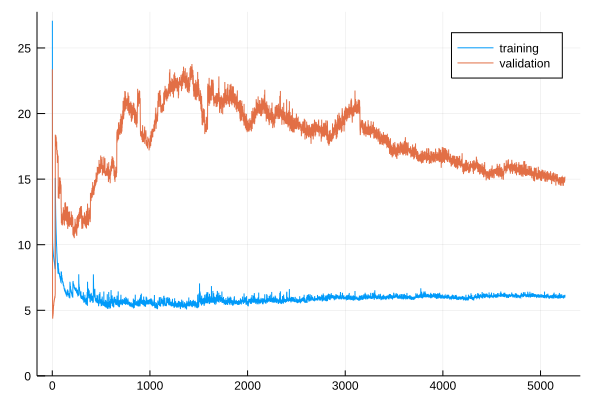

265.866123 seconds (765.52 M allocations: 100.712 GiB, 13.85% gc time)


Progress:  88%|████████████████████████████████████     |  ETA: 2:55:09

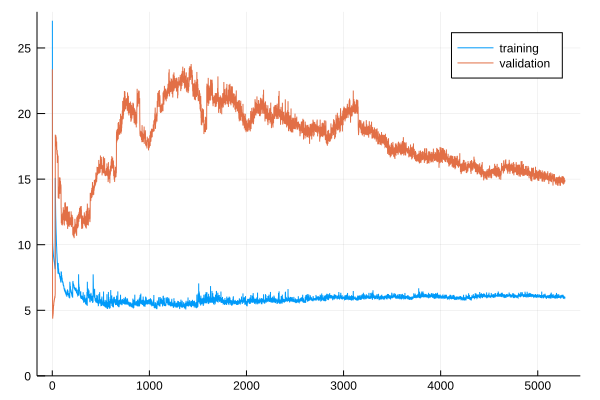

266.817164 seconds (770.07 M allocations: 101.309 GiB, 13.86% gc time)


Progress:  88%|████████████████████████████████████     |  ETA: 2:48:28

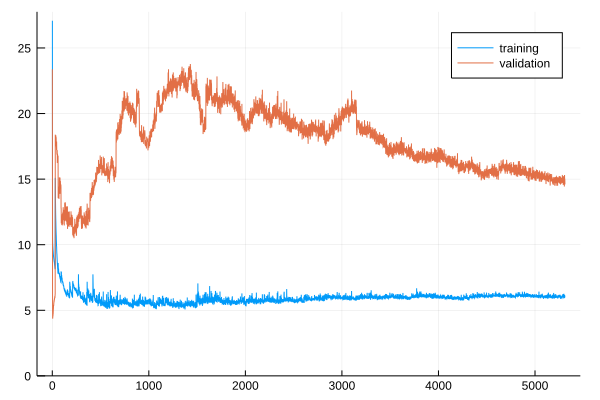

269.426880 seconds (774.36 M allocations: 101.870 GiB, 13.92% gc time)


Progress:  88%|████████████████████████████████████     |  ETA: 2:41:41

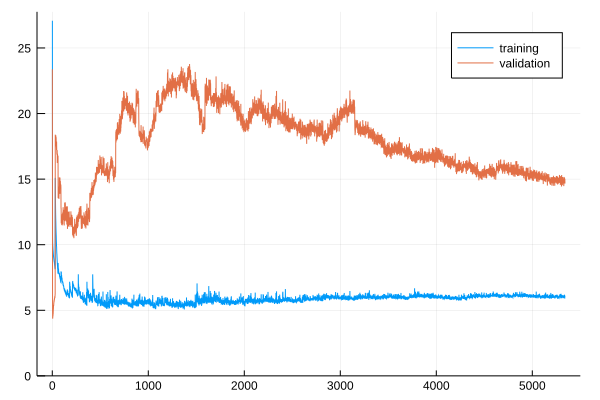

268.643589 seconds (778.90 M allocations: 102.468 GiB, 13.89% gc time)


Progress:  89%|████████████████████████████████████     |  ETA: 2:34:56

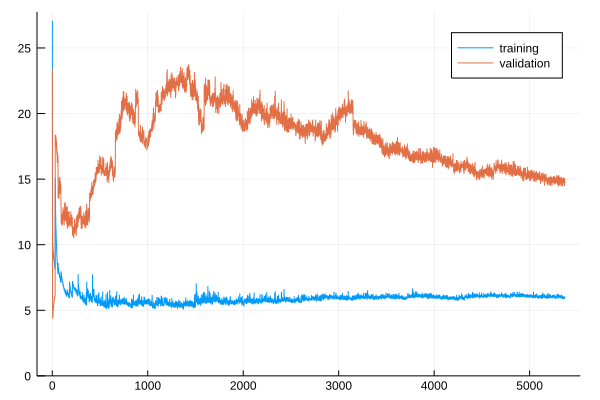

271.596966 seconds (783.44 M allocations: 103.065 GiB, 13.87% gc time)


Progress:  90%|█████████████████████████████████████    |  ETA: 2:28:09

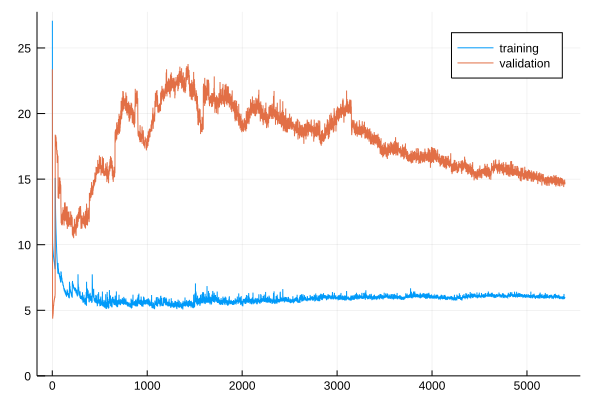

272.632104 seconds (787.98 M allocations: 103.662 GiB, 13.78% gc time)


Progress:  90%|█████████████████████████████████████    |  ETA: 2:21:21

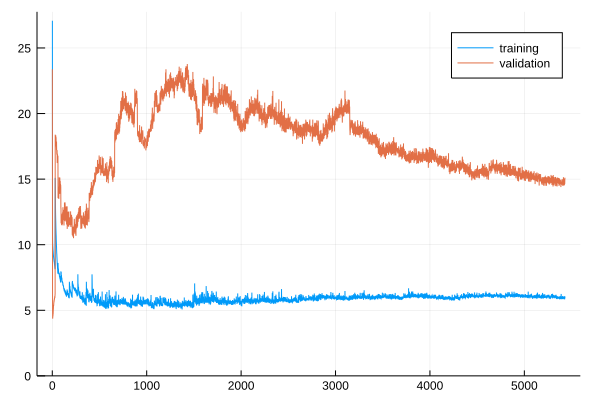

275.880800 seconds (792.53 M allocations: 104.260 GiB, 13.86% gc time)


Progress:  90%|█████████████████████████████████████    |  ETA: 2:14:33

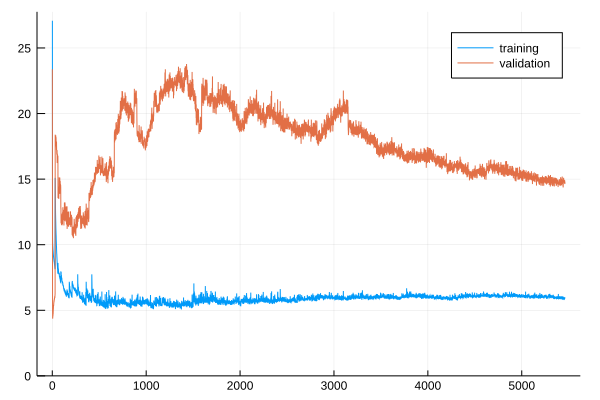

313.194339 seconds (797.07 M allocations: 104.857 GiB, 13.11% gc time)


Progress:  91%|█████████████████████████████████████    |  ETA: 2:07:48

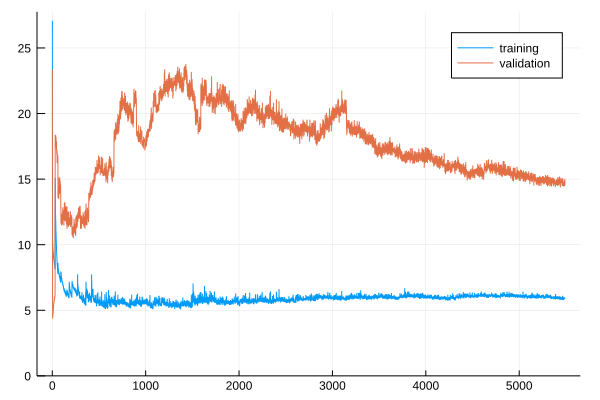

301.744901 seconds (801.61 M allocations: 105.455 GiB, 13.39% gc time)


Progress:  92%|██████████████████████████████████████   |  ETA: 2:00:59

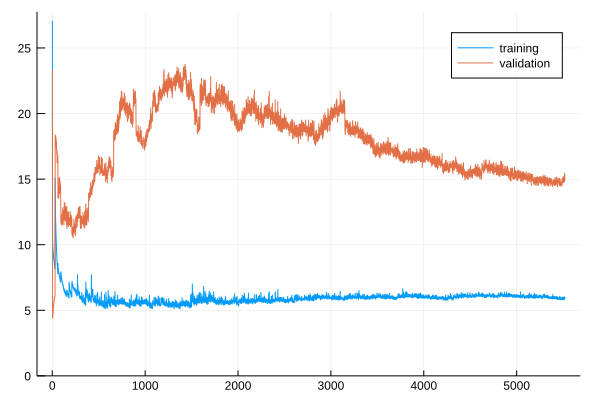

309.626147 seconds (806.15 M allocations: 106.052 GiB, 13.29% gc time)


Progress:  92%|██████████████████████████████████████   |  ETA: 1:54:09

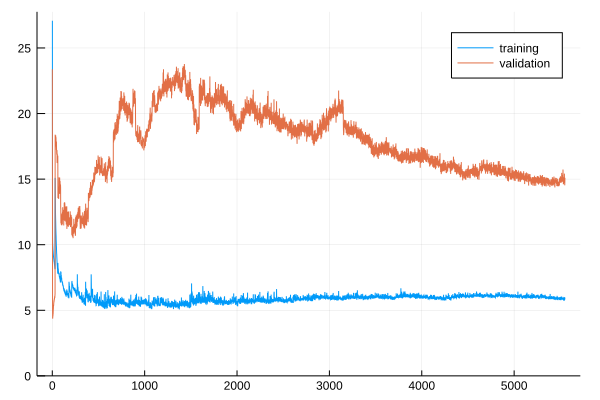

307.898129 seconds (810.46 M allocations: 106.620 GiB, 13.42% gc time)


Progress:  92%|██████████████████████████████████████   |  ETA: 1:47:15

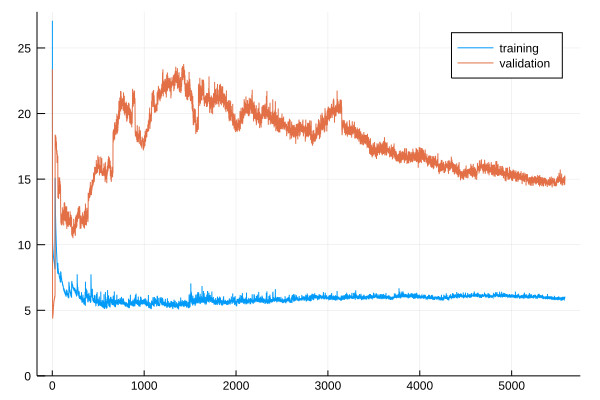

312.300734 seconds (815.00 M allocations: 107.217 GiB, 13.24% gc time)


Progress:  93%|██████████████████████████████████████   |  ETA: 1:40:21

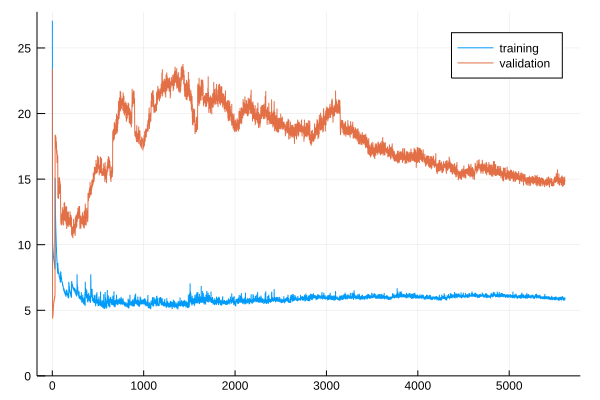

311.819875 seconds (819.23 M allocations: 107.774 GiB, 13.27% gc time)


Progress:  94%|██████████████████████████████████████   |  ETA: 1:33:23

captured: InterruptException()


Unexpected end of input
 ...when parsing byte with value '0'
Stacktrace:
 [1] 

LoadError: [91mMethodError: no method matching LearningMPC.MPCResults{Float64}(::Void, ::Void, ::Array{Float64,1}, ::LearningMPC.MIPResults)[39m

_error(::String, ::JSON.Parser.StreamingParserState{TCPSocket}) at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/JSON/src/Parser.jl:148
 [2] byteat(::JSON.Parser.StreamingParserState{TCPSocket}) at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/JSON/src/Parser.jl:58
 [3] chomp_space! at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/JSON/src/Parser.jl:115 [inlined]
 [4] parse_value(::JSON.Parser.ParserContext{Dict{String,Any},Int64}, ::JSON.Parser.StreamingParserState{TCPSocket}) at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/JSON/src/Parser.jl:158
 [5] #parse#2(::Type{Dict{String,Any}}, ::Type{Int64}, ::Function, ::TCPSocket) at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/JSON/src/Parser.jl:406
 [6] macro expansion at /home/rdeits/locomotion/explorations/learning-mpc-2/packages/v0.6/Lazy/src/macros.jl:241 [inlined]
 [7] macro expansion at /home/rdeits/locomotion/explorations/learning-

In [7]:
library_file = "library-mimic-2.jld2"
dataset_file = "boxatlas-regularized-mimic-2.jld2"

if isfile(library_file)
    all_training_data, all_validation_data = jldopen(library_file) do file
        file["training"], file["testing"]
    end
else
    all_training_data = Vector{Tuple{eltype(sample_sink.samples)}}()
    all_validation_data = Vector{Tuple{eltype(sample_sink.samples)}}()
end;

datasets = Vector{LearningMPC.Dataset{Float64}}()
losses = Vector{Tuple{Float64, Float64}}()

N_iter = 200
σv = 2.0

@showprogress for i in 1:N_iter
    dataset = LearningMPC.Dataset(lqrsol)
    for i in 1:2
        collect_into!(dataset.training_data, σv * sqrt(i / N_iter))
    end
    collect_into!(dataset.validation_data, σv * sqrt(i / N_iter))
    
    filter!(dataset.training_data) do sample
        all(isfinite, sample.input)
    end
    filter!(dataset.validation_data) do sample
        all(isfinite, sample.input)
    end
    
    append!(all_training_data, tuple.(dataset.training_data))
    append!(all_validation_data, tuple.(dataset.validation_data))

    @time for i in 1:30
        Flux.train!(loss, shuffleobs(all_training_data), optimizer)
        push!(losses, 
            (mean(xy -> Flux.Tracker.data(loss(xy...)), 
                  all_training_data),
             mean(xy -> Flux.Tracker.data(loss(xy...)), 
                  all_validation_data)))
    end
    push!(datasets, dataset)
    
    jldopen(dataset_file, "w") do file
        file["datasets"] = datasets
        file["net"] = net
        file["lqrsol"] = lqrsol
        file["mpc_params"] = Dict(
            "Δt" => params.Δt, 
            "horizon" => params.horizon,
        )
        file["losses"] = losses
    end
    
    jldopen(library_file, "w") do file
        file["training"] = all_training_data
        file["testing"] = all_validation_data
    end
    
    plt = plot(first.(losses), label="training")
    plot!(plt, last.(losses), label="validation")
    ylims!(plt, (0, ylims(plt)[2]))
    display(plt)
end